<a href="https://colab.research.google.com/github/ArthurChan-1111/Bitcoin_prediction/blob/main/Bitcoin_Price_Forecasting_5104.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Import Packages

In [1]:
# Check if running in Colab
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:
    !pip install pandas_ta
    !pip install numpy==1.23.5
    !pip install pandas
    !pip install seaborn
    !pip install xgboost

    !git clone https://github.com/ArthurChan-1111/Bitcoin_prediction.git

    %cd Bitcoin_prediction
    %pip install pandas_ta
else:
    print("Not running in Colab, skipping git clone and directory change")

Cloning into 'Bitcoin_prediction'...
remote: Enumerating objects: 701, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 701 (delta 44), reused 19 (delta 16), pack-reused 646 (from 4)
Receiving objects: 100% (701/701), 317.18 MiB | 24.92 MiB/s, done.
Resolving deltas: 100% (380/380), done.
/content/Bitcoin_prediction


In [2]:
# General Libraries
import numpy as np
import pandas as pd
import pandas_ta as ta
import csv
import warnings
from tqdm import tqdm
from tqdm.auto import tqdm
from scipy import stats
from scipy.stats import zscore

# Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt
import pylab as py

# Data Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# General Model Selection and Metrics
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    TimeSeriesSplit,
    RepeatedKFold,
    cross_val_score,
    StratifiedKFold
)

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score
)

# Regression Models and Tools
from sklearn.linear_model import (
    LinearRegression,
    Ridge,
    Lasso,
    ElasticNet,
    RidgeCV,
    LassoCV,
    ElasticNetCV
)

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (
    BaggingRegressor,
    RandomForestRegressor,
    GradientBoostingRegressor,
    AdaBoostRegressor,
    StackingRegressor
)
from xgboost import XGBRegressor

# Stats Models
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import (
    variance_inflation_factor,
    summary_table,
    OLSInfluence
)
from statsmodels.regression.linear_model import OLSResults
from statsmodels.stats.stattools import durbin_watson as dwtest
from statsmodels.sandbox.stats.runs import runstest_1samp
from statsmodels.stats.diagnostic import het_white
from statsmodels.compat import lzip

# Classification Models and Metrics
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    roc_auc_score
)

# Settings
warnings.filterwarnings("ignore")
pd.set_option("display.float_format", lambda x: "%.4f" % x)
pd.set_option("display.max_columns", None)


#Load dataset

In [3]:
btc_data = pd.read_csv('Bitcoin Historical Data.csv', on_bad_lines='skip', lineterminator='\n')
# Check if 'Change %\r' exists and rename it to 'Change'
if 'Change %\r' in btc_data.columns:
    btc_data.rename(columns={'Change %\r': 'Change'}, inplace=True)
btc_data.tail(5)

,Date,Price,Open,High,Low,Vol. ('000),Change
4107,1/5/2014,1014.7000,924.7000,1029.9000,911.4000,21.37,9.74%\r
4108,1/4/2014,924.7000,884.3000,932.2000,848.3000,14.24,4.57%\r
4109,1/3/2014,884.3000,856.9000,888.2000,839.4000,9.71,3.19%\r
4110,1/2/2014,856.9000,815.9000,886.2000,810.5000,12.81,5.02%\r
4111,1/1/2014,815.9000,805.9000,829.9000,771.0000,10.76,1.24%


In [4]:
# Convert the dictionary to a DataFrame
btc_data = pd.DataFrame(btc_data)

# Parse the "Date" column into datetime format
btc_data["Date"] = pd.to_datetime(btc_data["Date"], format="%m/%d/%Y")

# Sort the data by date in ascending order
btc_data.sort_values(by="Date", ascending=True, inplace=True)


In [5]:
gold_price_data = pd.read_csv('gold_price_data.csv', on_bad_lines='skip', lineterminator='\n', sep=';')
# Check if 'Gold_Volume %\r' exists and rename it to 'Gold_Volume %'
if 'Gold_Volume\r' in gold_price_data.columns:
    gold_price_data.rename(columns={'Gold_Volume\r': 'Gold_Volume'}, inplace=True)
gold_price_data.tail(5)

,Date,Gold_Price,Gold_Volume
4047,2025-01-30,2794.0600,83835.0000
4048,2025-01-31,2799.2300,91164.0000
4049,2025-02-01,2799.2300,91164.0000
4050,2025-02-02,2799.2300,91164.0000
4051,2025-02-03,2794.4100,1631.0000


In [6]:
risk_free_data = pd.read_csv('risk_free_data.csv', on_bad_lines='skip', lineterminator='\n', sep=',')
# rename the Yield_Spread\r to Yield_Spread
risk_free_data.rename(columns={'Yield_Spread\r': 'Yield_Spread'}, inplace=True)
risk_free_data.tail(5)

,Date,US_10Y,Yield_Spread
4126,2025-04-19,4.3400,0.5300
4127,2025-04-20,4.3400,0.5300
4128,2025-04-21,4.4200,0.6700
4129,2025-04-22,4.4100,0.6500
4130,2025-04-23,4.4000,0.5900


In [7]:
spy_data = pd.read_csv('spy_data.csv', on_bad_lines='skip', lineterminator='\n', sep=',')
# Check if 'SPY_Volume\r' exists and rename it to 'SPY_Volume'
if 'SPY_Volume\r' in spy_data.columns:
    spy_data.rename(columns={'SPY_Volume\r': 'SPY_Volume'}, inplace=True)
spy_data.tail(5)

,Date,SPY_Price,SPY_Volume
4114,2025-04-07,504.3800,256611400.0000
4115,2025-04-08,496.4800,165816600.0000
4116,2025-04-09,548.6200,241867300.0000
4117,2025-04-10,524.5800,162331200.0000
4118,2025-04-11,533.9400,97741700.0000


In [8]:
eth_data = pd.read_csv('eth_data.csv', on_bad_lines='skip', lineterminator='\n', sep=',')

# Remove the dollar sign and convert 'ETH_Price' to a numeric type
eth_data['ETH_Price'] = eth_data['ETH_Price'].replace('[\$,]', '', regex=True).astype(float)

# Check if 'ETH_Volume %\r' exists and rename it to 'ETH_Volume %'
if 'ETH_Volume\r' in eth_data.columns:
    eth_data.rename(columns={'ETH_Volume\r': 'ETH_Volume'}, inplace=True)

eth_data.tail(5)

,Date,ETH_Price,ETH_Volume
3545,2025-04-21,1579.0000,7152430.0000
3546,2025-04-22,1757.0000,11023237.0000
3547,2025-04-23,1795.0000,9128461.0000
3548,2025-04-24,1768.0000,6161937.0000
3549,2025-04-25,1787.0000,7136697.0000


In [9]:
#Change the 'Date' to datetime format
gold_price_data['Date'] = pd.to_datetime(gold_price_data['Date'])
risk_free_data['Date'] = pd.to_datetime(risk_free_data['Date'])
spy_data['Date'] = pd.to_datetime(spy_data['Date'])
eth_data['Date'] = pd.to_datetime(eth_data['Date'])

#Data Preprocessing

In [10]:
#Function to clean and convert volume data
def clean_volume(volume):
    if isinstance(volume, str):  # Check if the value is a string
        volume = volume.replace(',', '')  # Remove commas
        if 'B' in volume:  # If the value contains 'B' (billions)
            return float(volume.replace('B', '')) * 1_000_000_000
        elif 'M' in volume:  # If the value contains 'M' (millions)
            return float(volume.replace('M', '')) * 1_000_000
        elif 'K' in volume:  # If the value contains 'K' (thousands)
            return float(volume.replace('K', '')) * 1_000
        else:  # If no suffix is present, convert to float directly
            return float(volume)
    return np.nan  # Handle unexpected cases

# Apply the cleaning function to the volume column
btc_data["Volume"] = btc_data["Vol. ('000)"].apply(clean_volume)
btc_data = btc_data.drop("Vol. ('000)", axis=1)

# 4. Remove '%' from "Change %" and convert to numeric
btc_data.rename(columns={"Change %\r": "Change"}, inplace=True)
btc_data["Change"] = btc_data["Change"].str.replace("%", "").str.strip().astype(float)

In [11]:
# Check for missing values in btc_data
missing_values = btc_data.isnull().sum()
print("Missing values in each column:")
print(missing_values[missing_values > 0])

# Ensure 'Date' is sorted
btc_data = btc_data.sort_values('Date')

# Calculate the difference between consecutive dates
btc_data['Date_Diff'] = btc_data['Date'].diff().dt.days

# Check if all differences are 1 day
if (btc_data['Date_Diff'].iloc[1:] == 1).all():
    print("All dates are consecutive.")
else:
    print("There are missing dates.")
    print(btc_data[btc_data['Date_Diff'] > 1])  # Display rows with missing dates

# Drop the 'Date_Diff' column after the check
btc_data.drop(columns=['Date_Diff'], inplace=True)

Missing values in each column:
Series([], dtype: int64)
There are missing dates.
         Date      Price       Open       High        Low  Change   Volume  \
82 2025-01-13 94534.3000 94540.5000 95906.9000 89664.8000 -0.0800 115.2000   

    Date_Diff  
82     2.0000  


In [12]:
# Define the missing data as a dictionary
missing_data = {
    'Date': '01/12/2025',
    'Price': 94541.8,
    'Open': 94600.0,
    'High': 95384.3,
    'Low': 93711.2,
    'Volume': 17.60,  # Assuming 'Vol. (\'000)' is in thousands
    'Change': -0.07  # Assuming 'Change %' is already converted to a float
}

# Convert the dictionary to a DataFrame
missing_data_df = pd.DataFrame([missing_data])

# Ensure the 'Date' column is in datetime format
missing_data_df['Date'] = pd.to_datetime(missing_data_df['Date'])

# Append the missing data to btc_data
btc_data = pd.concat([btc_data, missing_data_df], ignore_index=True)

# Filter the data for the date range 01/10/2025 to 01/20/2025
filtered_data = btc_data[(btc_data['Date'] >= '2025-01-10') & (btc_data['Date'] <= '2025-01-20')]

# Display the filtered data
print(filtered_data)

           Date       Price        Open        High         Low  Change  \
4027 2025-01-10  94724.1000  92540.5000  95760.6000  92310.6000  2.3600   
4028 2025-01-11  94612.0000  94724.0000  94765.5000  93847.8000 -0.1200   
4029 2025-01-13  94534.3000  94540.5000  95906.9000  89664.8000 -0.0800   
4030 2025-01-14  96542.1000  94536.7000  97361.2000  94359.5000  2.1200   
4031 2025-01-15 100499.8000  96547.4000 100671.0000  96501.9000  4.1000   
4032 2025-01-16 100004.5000 100499.9000 100812.4000  97400.2000 -0.4900   
4033 2025-01-17 104084.9000  99991.9000 105843.8000  99956.2000  4.0800   
4034 2025-01-18 104536.9000 104084.7000 104953.1000 102297.0000  0.4300   
4035 2025-01-19 101319.5000 104536.8000 106338.2000  99742.7000 -3.0800   
4036 2025-01-20 102197.7000 101313.3000 109228.6000  99676.0000  0.8700   
4112 2025-01-12  94541.8000  94600.0000  95384.3000  93711.2000 -0.0700   

       Volume  
4027 125.4200  
4028  72.6600  
4029 115.2000  
4030  87.7900  
4031  95.3200  
403

In [13]:
# Day of the week (0=Monday, 6=Sunday)
btc_data["Day_of_Week"] = btc_data["Date"].dt.dayofweek

# Week of the year
btc_data["Week_of_Year"] = btc_data["Date"].dt.isocalendar().week

# Month of the year
btc_data["Month"] = btc_data["Date"].dt.month

# Quarter of the year
btc_data["Quarter"] = btc_data["Date"].dt.quarter

# Year
btc_data["Year"] = btc_data["Date"].dt.year

## Signal Detection

In [14]:
# Calculate RSI, EMA, SMA, and MACD
btc_data["RSI_6"] = ta.rsi(btc_data["Price"], length=6)  # Relative Strength Index
btc_data["RSI_12"] = ta.rsi(btc_data["Price"], length=12)  # Relative Strength Index
btc_data["EMA_14"] = ta.ema(btc_data["Price"], length=14)  # Exponential Moving Average
btc_data["SMA_14"] = ta.sma(btc_data["Price"], length=14)  # Simple Moving Average

# Add On-Balance Volume (OBV)
btc_data["OBV"] = ta.obv(btc_data["Price"], btc_data["Volume"])

# Calculate MACD --------------------------------------------------------------------------------------
macd = ta.macd(btc_data["Price"], fast=12, slow=26, signal=9)
btc_data["MACD"] = macd["MACD_12_26_9"]
btc_data["MACD_Signal"] = macd["MACDs_12_26_9"]

# Create MACD_buy: 1 if MACD crosses above MACD_Signal, otherwise 0
btc_data["MACD_buy"] = 0  # Default to 0 (no buy signal)
btc_data.loc[
    (btc_data["MACD"] > btc_data["MACD_Signal"]) &  # MACD is above Signal
    (btc_data["MACD"].shift(1) <= btc_data["MACD_Signal"].shift(1)),  # Previous MACD was below or equal to Signal
    "MACD_buy"] = 1  # Buy signal

# Create MACD_sell: 1 if MACD crosses below MACD_Signal, otherwise 0
btc_data["MACD_sell"] = 0  # Default to 0 (no sell signal)
btc_data.loc[
    (btc_data["MACD"] <= btc_data["MACD_Signal"]) &  # MACD is below or equal to Signal
    (btc_data["MACD"].shift(1) > btc_data["MACD_Signal"].shift(1)),  # Previous MACD was above Signal
    "MACD_sell"] = 1  # Sell signal

# New Variable: MACD_above_signal (1 if MACD > MACD_Signal, otherwise 0)
btc_data["MACD_above_signal"] = (btc_data["MACD"] > btc_data["MACD_Signal"]).astype(int)

# New Variable: MACD_below_signal (1 if MACD <= MACD_Signal, otherwise 0)
btc_data["MACD_below_signal"] = (btc_data["MACD"] <= btc_data["MACD_Signal"]).astype(int)

# Create MACD_cum_buy: Accumulate consecutive days where MACD_above_signal is 1
btc_data["MACD_cum_buy"] = (
    btc_data["MACD_above_signal"]
    .groupby((btc_data["MACD_above_signal"] == 0).cumsum())  # Group by resets when MACD_above_signal is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["MACD_above_signal"] == 0, "MACD_cum_buy"] = 0  # Reset to 0 where the condition is not met

# Create MACD_cum_sell: Accumulate consecutive days where MACD_below_signal is 1
btc_data["MACD_cum_sell"] = (
    btc_data["MACD_below_signal"]
    .groupby((btc_data["MACD_below_signal"] == 0).cumsum())  # Group by resets when MACD_below_signal is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["MACD_below_signal"] == 0, "MACD_cum_sell"] = 0  # Reset to 0


# Calculate Bollinger Bands --------------------------------------------------------------------------------------
bb = ta.bbands(btc_data["Price"], length=20, std=2)  # 20-period BB with 2 standard deviations
btc_data["BB_upper"] = bb.get("BBU_20_2.0")  # Upper Bollinger Band
btc_data["BB_lower"] = bb.get("BBL_20_2.0")  # Lower Bollinger Band

# Create BB_Buy: 1 if Price crosses below the Lower Band, otherwise 0
btc_data["BB_Buy"] = 0  # Default to 0 (no buy signal)
btc_data.loc[
    (btc_data["Price"] < btc_data["BB_lower"]) &  # Price is below the Lower Band
    (btc_data["Price"].shift(1) >= btc_data["BB_lower"].shift(1)),  # Previous Price was above or equal to Lower Band
    "BB_Buy"] = 1  # Buy signal

# Create BB_Sell: 1 if Price crosses above the Upper Band, otherwise 0
btc_data["BB_Sell"] = 0  # Default to 0 (no sell signal)
btc_data.loc[
    (btc_data["Price"] > btc_data["BB_upper"]) &  # Price is above the Upper Band
    (btc_data["Price"].shift(1) <= btc_data["BB_upper"].shift(1)),  # Previous Price was below or equal to Upper Band
    "BB_Sell"] = 1  # Sell signal

# New Variable: Price_above_lower_band (1 if Price > BB_lower, otherwise 0)
btc_data["Price_below_BB_lower"] = (btc_data["Price"] < btc_data["BB_lower"]).astype(int)

# New Variable: Price_below_upper_band (1 if Price < BB_upper, otherwise 0)
btc_data["Price_above_BB_upper"] = (btc_data["Price"] > btc_data["BB_upper"]).astype(int)

# Create BB_cum_Buy: Accumulate consecutive days where Price_below_BB_lower is 1
btc_data["BB_cum_Buy"] = (
    btc_data["Price_below_BB_lower"]
    .groupby((btc_data["Price_below_BB_lower"] == 0).cumsum())  # Group by resets when Price_below_BB_lower is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["Price_below_BB_lower"] == 0, "BB_cum_Buy"] = 0  # Reset to 0 where the condition is not met

# Create BB_cum_Sell: Accumulate consecutive days where Price_above_BB_upper is 1
btc_data["BB_cum_Sell"] = (
    btc_data["Price_above_BB_upper"]
    .groupby((btc_data["Price_above_BB_upper"] == 0).cumsum())  # Group by resets when Price_above_BB_upper is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["Price_above_BB_upper"] == 0, "BB_cum_Sell"] = 0  # Reset to 0 where the condition is not met

# Calculate ATR --------------------------------------------------------------------------------------
btc_data["ATR"] = ta.atr(btc_data["High"], btc_data["Low"], btc_data["Price"], length=14)

# Set Stop-Loss Levels (Example with Long Trade)
atr_multiplier = 2
btc_data["Stop_Loss_Long"] = btc_data["Price"] - (btc_data["ATR"] * atr_multiplier) #Stop-Loss for Buy (Long) Trade
btc_data["Stop_Loss_Short"] = btc_data["Price"] + (btc_data["ATR"] * atr_multiplier) #Stop-Loss for Sell (Short) Trade

# Calculate VWAP --------------------------------------------------------------------------------------
btc_data.set_index("Date", inplace=True) # Set the "Date" column as the index
btc_data["VWAP"] = ta.vwap(btc_data["High"], btc_data["Low"], btc_data["Price"], btc_data["Volume"])

# Create VWAP_Buy: 1 if Price crosses above VWAP, otherwise 0
btc_data["VWAP_Buy"] = 0  # Default to 0 (no buy signal)
btc_data.loc[
    (btc_data["Price"] > btc_data["VWAP"]) &  # Price is above VWAP
    (btc_data["Price"].shift(1) <= btc_data["VWAP"].shift(1)),  # Previous Price was below or equal to VWAP
    "VWAP_Buy"] = 1  # Buy signal

# Create VWAP_Sell: 1 if Price crosses below VWAP, otherwise 0
btc_data["VWAP_Sell"] = 0  # Default to 0 (no sell signal)
btc_data.loc[
    (btc_data["Price"] < btc_data["VWAP"]) &  # Price is below VWAP
    (btc_data["Price"].shift(1) >= btc_data["VWAP"].shift(1)),  # Previous Price was above or equal to VWAP
    "VWAP_Sell"] = 1  # Sell signal

# Fear and greed index
fear_and_greed_index = pd.read_csv('fear_and_greed_index.csv')
# rename the date column in fear_and_greed_index to Date
fear_and_greed_index.rename(columns={"date": "Date", "value": "Fear_and_Greed_Index"}, inplace=True)
# convert the date column to datetime
fear_and_greed_index["Date"] = pd.to_datetime(fear_and_greed_index["Date"], format="%Y-%m-%d")
# dropping the timestamp, value_classification, time_until_update columns
fear_and_greed_index.drop(columns=["timestamp", "value_classification", "time_until_update"], inplace=True)
fear_and_greed_index.head()

# Join the two dataframes on the "Date" column, dropping
btc_data = btc_data.merge(fear_and_greed_index, on="Date", how="left")
btc_data.head(20)

# Support and Resistance Levels
btc_data["Support"] = btc_data["Low"].rolling(window=20).min()  # Lowest low in the past 20 days
btc_data["Resistance"] = btc_data["High"].rolling(window=20).max()  # Highest high in the past 20 days

# Add two columns for extreme fear and extreme greed
btc_data["Extreme_Fear"] = np.where(btc_data["Fear_and_Greed_Index"] < 20, 1, 0)
btc_data["Extreme_Greed"] = np.where(btc_data["Fear_and_Greed_Index"] > 80, 1, 0)
btc_data.describe().T

# Use 70 in RSI to classify overbought and 30 to classify oversold
btc_data["RSI_12_Oversold"] = np.where(btc_data["RSI_12"] < 30, 1, 0)  # Create RSI_12_Oversold column
btc_data.loc[btc_data["RSI_12_Oversold"] == 0, "Consecutive_RSI_12_Oversold"] = 0  # Reset to 0 where the condition is not met
btc_data["RSI_12_Overbought"] = np.where(btc_data["RSI_12"] > 70, 1, 0)

# Adding RSI_6 greater than RSI_12 to show bullish divergence and conversely
btc_data["RSI_Divergence"] = np.where(btc_data["RSI_6"] > btc_data["RSI_12"], 1, 0)
btc_data.describe().T


# Count consecutive appearances of Extreme_Fear
btc_data["Consecutive_Extreme_Fear"] = (
    btc_data["Extreme_Fear"]
    .groupby((btc_data["Extreme_Fear"] == 0).cumsum())  # Group by resets when Extreme_Fear is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["Extreme_Fear"] == 0, "Consecutive_Extreme_Fear"] = 0  # Reset to 0 where the condition is not met

# Count consecutive appearances of Extreme_Greed
btc_data["Consecutive_Extreme_Greed"] = (
    btc_data["Extreme_Greed"]
    .groupby((btc_data["Extreme_Greed"] == 0).cumsum())  # Group by resets when Extreme_Greed is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["Extreme_Greed"] == 0, "Consecutive_Extreme_Greed"] = 0  # Reset to 0 where the condition is not met

# Forward fill the missing value in 'Fear_and_Greed_Index'
btc_data['Fear_and_Greed_Index'] = btc_data['Fear_and_Greed_Index'].fillna(method='ffill')

# Count consecutive appearances of RSI_12_Overbought
btc_data["Consecutive_RSI_12_Overbought"] = (
    btc_data["RSI_12_Overbought"]
    .groupby((btc_data["RSI_12_Overbought"] == 0).cumsum())  # Group by resets when RSI_12_Overbought is 0
    .cumcount()  # Count consecutive days starting from 1
)
btc_data.loc[btc_data["RSI_12_Overbought"] == 0, "Consecutive_RSI_12_Overbought"] = 0  # Reset to 0 where the condition is not met

# Count consecutive appearances of RSI_12_Oversold
btc_data["Consecutive_RSI_12_Oversold"] = (
    btc_data["RSI_12_Oversold"]
    .groupby((btc_data["RSI_12_Oversold"] == 0).cumsum())  # Group by resets when RSI_12_Oversold is 0
    .cumcount()  # Count consecutive days starting from 1
)

In [15]:
#Add continous variables

#ATR ratio
btc_data['ATR_Ratio'] = (btc_data['ATR'] / btc_data['Price']) * 100

# Calculate 50-day and 200-day moving averages
btc_data['MA50'] = btc_data['Price'].rolling(window=50).mean()
btc_data['MA200'] = btc_data['Price'].rolling(window=200).mean()

# Calculate Price relative to 50-day MA (%)
btc_data['Price_vs_MA50'] = ((btc_data['Price'] - btc_data['MA50']) / btc_data['MA50']) * 100

# Calculate Price relative to 200-day MA (%)
btc_data['Price_vs_MA200'] = ((btc_data['Price'] - btc_data['MA200']) / btc_data['MA200']) * 100

# Calculate MA Distance Ratio (Ratio of MA50 to MA200 distance)
btc_data['MA_Distance_Ratio'] = ((btc_data['MA50'] - btc_data['MA200']) / btc_data['Price']) * 100

In [16]:
from scipy.stats import linregress

# Ensure btc_data is sorted by Date
btc_data = btc_data.sort_values('Date')

# 1. Volume_Ratio: Current volume / 20-day avg volume
btc_data['Avg_Volume_20'] = btc_data['Volume'].rolling(window=20).mean()
btc_data['Volume_Ratio'] = btc_data['Volume'] / btc_data['Avg_Volume_20']

# 2. OBV_Slope: 5-day slope of On-Balance Volume (OBV)
# Calculate OBV
btc_data['OBV'] = (np.sign(btc_data['Price'].diff()) * btc_data['Volume']).fillna(0).cumsum()

# Calculate 5-day slope of OBV
def calculate_slope(series):
    x = np.arange(len(series))
    slope, _, _, _, _ = linregress(x, series)
    return slope

btc_data['OBV_Slope'] = btc_data['OBV'].rolling(window=5).apply(calculate_slope, raw=False)

In [17]:
# Calculate the percentage price change over the next 7-day and 2-day (Target Variable for Regression)
btc_data["Pct_Change_7D"] = ((btc_data["Price"].shift(-7) - btc_data["Price"]) / btc_data["Price"]) * 100
btc_data["Pct_Change_2D"] = ((btc_data["Price"].shift(-2) - btc_data["Price"]) / btc_data["Price"]) * 100

# Create binary variables for 7-day and 2-day percentage changes
btc_data["Positive_7D"] = (btc_data["Pct_Change_7D"] > 0).astype(int)  # 1 if positive, 0 if negative
btc_data["Positive_2D"] = (btc_data["Pct_Change_2D"] > 0).astype(int)  # 1 if positive, 0 if negative

## Pattern Detection

In [18]:
# Asending Triangle
# Sort data by Date
btc_data = btc_data.sort_values('Date')

# Calculate exponential moving average for Resistance_Level
btc_data['Resistance_Level'] = btc_data['High'].ewm(span=7, adjust=False).mean()

# Identify rising trendline (higher lows)
btc_data['Low_Shifted'] = btc_data['Low'].shift(1)
btc_data['Higher_Low'] = (btc_data['Low'] > btc_data['Low_Shifted']).astype(int)

# Detect breakout using rolling mean of Volume
btc_data['Breakout'] = btc_data['Price'] > btc_data['Resistance_Level']

# Add ascending triangle detection signal
btc_data['Ascending_Triangle_Breakout'] = btc_data['Breakout']

# Ensure Breakout is binary (1 or 0)
btc_data['Breakout'] = btc_data['Breakout'].astype(int)

# Ensure Ascending_Triangle_Breakout is binary (1 or 0)
btc_data['Ascending_Triangle_Breakout'] = btc_data['Ascending_Triangle_Breakout'].astype(int)

# Calculate the rolling mean of Volume over 7 days
btc_data['Avg_Volume'] = btc_data['Volume'].rolling(window=7).mean()

# Detect breakout with volume confirmation
btc_data['Breakout_With_Volume'] = ((btc_data['High'] > btc_data['Resistance_Level']) &
                                    (btc_data['Volume'] > btc_data['Avg_Volume'])).astype(int)

# Add ascending triangle detection signal with volume
btc_data['Ascending_Triangle_Breakout_With_Volume'] = btc_data['Breakout_With_Volume']

In [19]:
# Count the number of breakouts
breakout_count = btc_data['Ascending_Triangle_Breakout_With_Volume'].sum()
print(f"Number of breakouts: {breakout_count}")

Number of breakouts: 1069


In [20]:
btc_data['Triangle_Completion'] = btc_data['Higher_Low'].rolling(window=7).mean()  # Simulate completion as a rolling mean of Higher_Low
btc_data['Triangle_Height'] = ((btc_data['High'] - btc_data['Low']) / btc_data['Price']).rolling(window=7).mean()  # Height as % of price
btc_data['Triangle_Duration'] = btc_data['Higher_Low'].rolling(window=7).sum()  # Duration as the sum of Higher_Low over 7 days
btc_data['Breakout_Strength'] = ((btc_data['High'] - btc_data['Resistance_Level']) * btc_data['Volume']).rolling(window=7).mean()  # Volume-adjusted breakout strength

In [21]:
#ADX Pattern (Show the strength of the trend, please only use ADX_Buy_Signal)
!pip install ta
import ta
# Calculate ADX, +DI, and -DI using the ta library
btc_data['ADX'] = ta.trend.adx(btc_data['High'], btc_data['Low'], btc_data['Price'], window=14)
btc_data['Positive_DI'] = ta.trend.adx_pos(btc_data['High'], btc_data['Low'], btc_data['Price'], window=14)
btc_data['Negative_DI'] = ta.trend.adx_neg(btc_data['High'], btc_data['Low'], btc_data['Price'], window=14)

# Define the ADX threshold for a strong trend
adx_threshold = 25

# Generate trade signals
btc_data['ADX_Buy_Signal'] = ((btc_data['ADX'] > adx_threshold) & (btc_data['Positive_DI'] > btc_data['Negative_DI'])).astype(int)
btc_data['ADX_Sell_Signal'] = ((btc_data['ADX'] > adx_threshold) & (btc_data['Negative_DI'] > btc_data['Positive_DI'])).astype(int)

  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29412 sha256=03c3c08ec0ee9430e0cd97abc74111f6100efd16f2a43d8391232a72b15ce628
  Stored in directory: /root/.cache/pip/wheels/a1/d7/29/7781cc5eb9a3659d032d7d15bdd0f49d07d2b24fec29f44bc4
Successfully built ta


In [22]:
# Create columns for consecutive ADX Buy and Sell signals
btc_data['Consecutive_ADX_Buy'] = (
    btc_data['ADX_Buy_Signal']
    .groupby((btc_data['ADX_Buy_Signal'] == 0).cumsum())
    .cumcount()
)
btc_data.loc[btc_data['ADX_Buy_Signal'] == 0, 'Consecutive_ADX_Buy'] = 0

btc_data['Consecutive_ADX_Sell'] = (
    btc_data['ADX_Sell_Signal']
    .groupby((btc_data['ADX_Sell_Signal'] == 0).cumsum())
    .cumcount()
)
btc_data.loc[btc_data['ADX_Sell_Signal'] == 0, 'Consecutive_ADX_Sell'] = 0

In [23]:
# Count the number of breakout signals
breakout_count = btc_data['ADX_Buy_Signal'].sum()
print(f"Number of breakout signals: {breakout_count}")

Number of breakout signals: 1377


In [24]:
# Add continuous features
# ADX_Strength: How far ADX is above the threshold (ADX - 25, 0 if below)
btc_data['ADX_Strength'] = (btc_data['ADX'] - adx_threshold).clip(lower=0)

# ADX_Trend_Duration: Number of consecutive days ADX > 25
btc_data['ADX_Trend_Duration'] = (btc_data['ADX'] > adx_threshold).astype(int).groupby((btc_data['ADX'] <= adx_threshold).astype(int).cumsum()).cumsum()

# ADX_Trend_Direction: +DI minus -DI (positive for uptrend, negative for downtrend)
btc_data['ADX_Trend_Direction'] = btc_data['Positive_DI'] - btc_data['Negative_DI']

In [25]:
# Calculate Stochastic Oscillator (%K and %D)
btc_data['Stochastic_perK'] = ta.momentum.stoch(
    btc_data['High'], btc_data['Low'], btc_data['Price'], window=14, smooth_window=3
)
btc_data['Stochastic_perD'] = ta.momentum.stoch_signal(
    btc_data['High'], btc_data['Low'], btc_data['Price'], window=14, smooth_window=3
)

# Define Stochastic Buy and Sell Signals
btc_data['Stochastic_Buy_Signal'] = np.where(
    (btc_data['Stochastic_perK'] < 20) & (btc_data['Stochastic_perK'] > btc_data['Stochastic_perD']),
    1,  # Buy Signal
    0   # No Signal
)

btc_data['Stochastic_Sell_Signal'] = np.where(
    (btc_data['Stochastic_perK'] > 80) & (btc_data['Stochastic_perK'] < btc_data['Stochastic_perD']),
    1,  # Sell Signal
    0   # No Signal
)

In [26]:
# Add consecutive features for Stochastic signals
btc_data['Consecutive_Stochastic_Buy'] = (
    btc_data['Stochastic_Buy_Signal']
    .groupby((btc_data['Stochastic_Buy_Signal'] == 0).cumsum())
    .cumcount()
)

btc_data['Consecutive_Stochastic_Sell'] = (
    btc_data['Stochastic_Sell_Signal']
    .groupby((btc_data['Stochastic_Sell_Signal'] == 0).cumsum())
    .cumcount()
)

In [27]:
#Bullish and Bearish Engulfing
def detect_bullish_engulfing(data):
    return (
        (data['Price'] > data['Open']) &  # Current candle is bullish
        (data['Price'].shift(1) < data['Open'].shift(1)) &  # Previous candle is bearish
        (data['Open'] < data['Price'].shift(1)) &  # Current open is below previous close
        (data['Price'] > data['Open'].shift(1))    # Current close is above previous open
    )

def detect_bearish_engulfing(data):
    return (
        (data['Price'] < data['Open']) &  # Current candle is bearish
        (data['Price'].shift(1) > data['Open'].shift(1)) &  # Previous candle is bullish
        (data['Open'] > data['Price'].shift(1)) &  # Current open is above previous close
        (data['Price'] < data['Open'].shift(1))    # Current close is below previous open
    )

# Apply the detection functions to btc_data
btc_data['Bullish_Engulfing'] = detect_bullish_engulfing(btc_data).astype(int)
btc_data['Bearish_Engulfing'] = detect_bearish_engulfing(btc_data).astype(int)

# Display the rows where patterns are detected
bullish_patterns = btc_data[btc_data['Bullish_Engulfing'] == 1]
bearish_patterns = btc_data[btc_data['Bearish_Engulfing'] == 1]

In [28]:
breakout_count = btc_data['Bullish_Engulfing'].sum()
print(f"Number of breakout signals: {breakout_count}")

Number of breakout signals: 145


In [29]:
breakout_count = btc_data['Bearish_Engulfing'].sum()
print(f"Number of breakout signals: {breakout_count}")

Number of breakout signals: 130


In [30]:
def detect_hammer(data):
    """
    Detects hammer candlestick patterns.
    A hammer has:
    1. A small body at the top
    2. A long lower shadow (at least 2x the body)
    3. Little or no upper shadow
    """

    # Calculate body and shadows
    data['Body'] = data['Price'] - data['Open']
    data['Upper_Shadow'] = data['High'] - data[['Open', 'Price']].max(axis=1)
    data['Lower_Shadow'] = data[['Open', 'Price']].min(axis=1) - data['Low']

    # Define hammer criteria
    data['Hammer'] = (
        # Body is small (using 0.3 times high-low range as threshold)
        (abs(data['Body']) <= 0.3 * (data['High'] - data['Low'])) &
        # Lower shadow is at least 2x the body length
        (data['Lower_Shadow'] >= 2 * abs(data['Body'])) &
        # Upper shadow is relatively small
        (data['Upper_Shadow'] <= 0.1 * (data['High'] - data['Low']))
    ).astype(int)

    # Clean up temporary columns
    data.drop(['Body', 'Upper_Shadow', 'Lower_Shadow'], axis=1, inplace=True)

    # Count consecutive hammers
    data['Consecutive_Hammer'] = (
        data['Hammer']
        .groupby((data['Hammer'] == 0).cumsum())
        .cumcount()
    )
    data.loc[data['Hammer'] == 0, 'Consecutive_Hammer'] = 0

    return data

# Apply hammer detection to the data
btc_data = detect_hammer(btc_data)

In [31]:
hammer_count = btc_data['Hammer'].sum()
print(f"Total number of hammer patterns detected: {hammer_count}")

# Also get the number of cases where we had consecutive hammers
consecutive_hammers = btc_data[btc_data['Consecutive_Hammer'] > 0]
print(f"Number of cases with consecutive hammers: {len(consecutive_hammers)}")
print(f"Maximum number of consecutive hammers: {btc_data['Consecutive_Hammer'].max()}")

Total number of hammer patterns detected: 94
Number of cases with consecutive hammers: 94
Maximum number of consecutive hammers: 2


In [32]:
def detect_three_white_soldiers(data, min_body_ratio=0.5):
    # Create candle body and shadow lengths
    data['Body'] = data['Price'] - data['Open']
    data['Upper_Shadow'] = data['High'] - data[['Price', 'Open']].max(axis=1)
    data['Lower_Shadow'] = data[['Price', 'Open']].min(axis=1) - data['Low']

    # Initialize Three White Soldiers pattern array
    three_white_soldiers = np.zeros(len(data))

    for i in range(2, len(data)):
        # Check if we have 3 consecutive bullish candles
        bullish_candles = (data['Body'].iloc[i] > 0 and
                          data['Body'].iloc[i-1] > 0 and
                          data['Body'].iloc[i-2] > 0)

        if bullish_candles:
            # Calculate total candle lengths
            candle_lengths = [
                data['High'].iloc[i] - data['Low'].iloc[i],
                data['High'].iloc[i-1] - data['Low'].iloc[i-1],
                data['High'].iloc[i-2] - data['Low'].iloc[i-2]
            ]

            # Calculate body ratios
            body_ratios = [
                data['Body'].iloc[i] / candle_lengths[0],
                data['Body'].iloc[i-1] / candle_lengths[1],
                data['Body'].iloc[i-2] / candle_lengths[2]
            ]

            # Check if each candle has a sufficient body ratio
            strong_bodies = all(ratio >= min_body_ratio for ratio in body_ratios)

            # Check if each candle opens within previous candle's body
            progressive_opens = (
                data['Open'].iloc[i] > data['Open'].iloc[i-1] and
                data['Open'].iloc[i-1] > data['Open'].iloc[i-2]
            )

            # Check if each candle closes higher than previous candle
            progressive_closes = (
                data['Price'].iloc[i] > data['Price'].iloc[i-1] and
                data['Price'].iloc[i-1] > data['Price'].iloc[i-2]
            )

            # If all conditions are met, mark as Three White Soldiers
            if strong_bodies and progressive_opens and progressive_closes:
                three_white_soldiers[i] = 1

    # Add the pattern to the dataframe
    data['Three_White_Soldiers'] = three_white_soldiers

    # Count the occurrences
    pattern_count = int(three_white_soldiers.sum())

    return pattern_count, data['Three_White_Soldiers']

# Apply the detection
pattern_count, three_white_soldiers = detect_three_white_soldiers(btc_data)
print(f"Number of Three White Soldiers patterns detected: {pattern_count}")

Number of Three White Soldiers patterns detected: 50


In [33]:
def detect_three_black_crows(data, min_body_ratio=0.5):
    # Create candle body and shadow lengths
    data['Body'] = data['Price'] - data['Open']
    data['Upper_Shadow'] = data['High'] - data[['Price', 'Open']].max(axis=1)
    data['Lower_Shadow'] = data[['Price', 'Open']].min(axis=1) - data['Low']

    # Initialize Three Black Crows pattern array
    three_black_crows = np.zeros(len(data))

    for i in range(2, len(data)):
        # Check if we have 3 consecutive bearish candles
        bearish_candles = (data['Body'].iloc[i] < 0 and
                          data['Body'].iloc[i-1] < 0 and
                          data['Body'].iloc[i-2] < 0)

        if bearish_candles:
            # Calculate total candle lengths
            candle_lengths = [
                data['High'].iloc[i] - data['Low'].iloc[i],
                data['High'].iloc[i-1] - data['Low'].iloc[i-1],
                data['High'].iloc[i-2] - data['Low'].iloc[i-2]
            ]

            # Calculate body ratios
            body_ratios = [
                abs(data['Body'].iloc[i]) / candle_lengths[0],
                abs(data['Body'].iloc[i-1]) / candle_lengths[1],
                abs(data['Body'].iloc[i-2]) / candle_lengths[2]
            ]

            # Check if each candle has a sufficient body ratio
            strong_bodies = all(ratio >= min_body_ratio for ratio in body_ratios)

            # Check if each candle opens within previous candle's body
            progressive_opens = (
                data['Open'].iloc[i] < data['Open'].iloc[i-1] and
                data['Open'].iloc[i-1] < data['Open'].iloc[i-2]
            )

            # Check if each candle closes lower than previous candle
            progressive_closes = (
                data['Price'].iloc[i] < data['Price'].iloc[i-1] and
                data['Price'].iloc[i-1] < data['Price'].iloc[i-2]
            )

            # If all conditions are met, mark as Three Black Crows
            if strong_bodies and progressive_opens and progressive_closes:
                three_black_crows[i] = 1

    # Add the pattern to the dataframe
    data['Three_Black_Crows'] = three_black_crows

    # Count the occurrences
    pattern_count = int(three_black_crows.sum())

    return pattern_count, data['Three_Black_Crows']

# Apply the detection
pattern_count, three_black_crows = detect_three_black_crows(btc_data)
print(f"Number of Three Black Crows patterns detected: {pattern_count}")

Number of Three Black Crows patterns detected: 28


##Join External Data Source

In [34]:
#Left join gold_price_data, risk_free_data, spy500 to btc_data
btc_data = pd.merge(btc_data, gold_price_data, on='Date', how='left') #till 2025-02-03
btc_data = pd.merge(btc_data, risk_free_data, on='Date', how='left')
btc_data = pd.merge(btc_data, spy_data, on='Date', how='left') #till 2025-04-11
btc_data = pd.merge(btc_data, eth_data, on='Date', how='left') #from 2015-08-07
#As other external data have market closeure, all na filled by previous day close data

In [35]:
btc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4113 entries, 0 to 4112
Columns: 109 entries, Date to ETH_Volume
dtypes: UInt32(1), datetime64[ns](1), float64(60), int32(4), int64(43)
memory usage: 3.3 MB


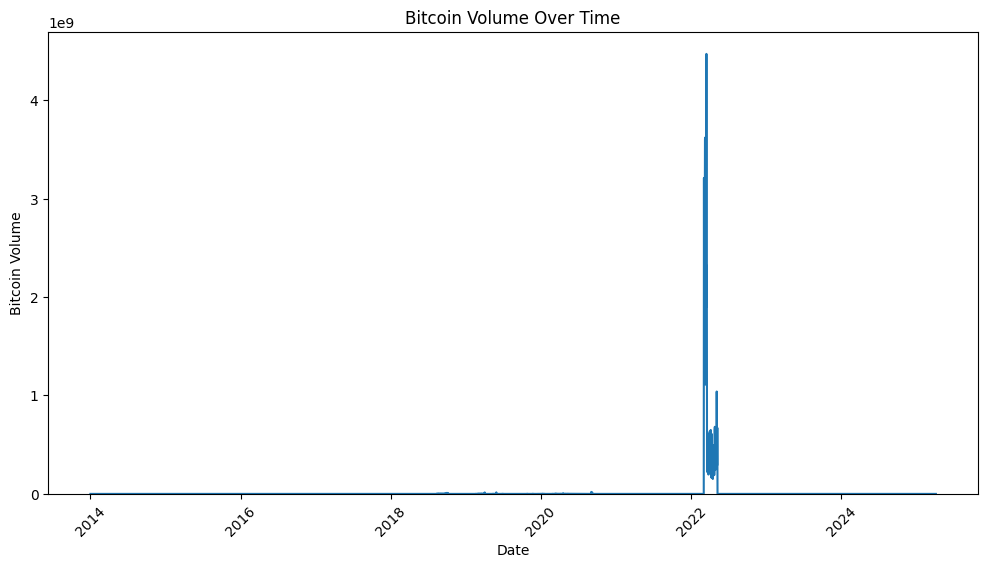

In [36]:
# Plot Bitcoin Volume over date
plt.figure(figsize=(12, 6))
plt.plot(btc_data['Date'], btc_data['Volume'])
plt.xlabel('Date')
plt.ylabel('Bitcoin Volume')
plt.ylim(bottom=-2)  # Set the lower limit to 0
plt.title('Bitcoin Volume Over Time')
plt.xticks(rotation=45)
plt.show()

In [37]:
btc_data['Volume'].describe()

,Volume
count,4113.0000
mean,14862610.4592
std,170659881.1592
min,0.2600
25%,46.5600
50%,91.5400
75%,248.4400
max,4470000000.0000


Since we can observe the spikes happened from 2018 to mid-2022, we try to fit the model avoiding the spikes here.

In [38]:
# Find the min and max of date with volume greater than 1
btc_data[btc_data['Volume'] > 1]['Date'].min(), btc_data[btc_data['Volume'] > 1]['Date'].max()
# Print the min and max date with volume greater than 1
print("Min date with volume > 1:", btc_data[btc_data['Volume'] > 1]['Date'].min())
print("Max date with volume > 1:", btc_data[btc_data['Volume'] > 1]['Date'].max())


Min date with volume > 1: 2014-01-01 00:00:00
Max date with volume > 1: 2025-04-05 00:00:00


In [39]:
# Drop the rows with date before 2022-05-09
btc_data = btc_data[btc_data['Date'] >= '2022-05-09']

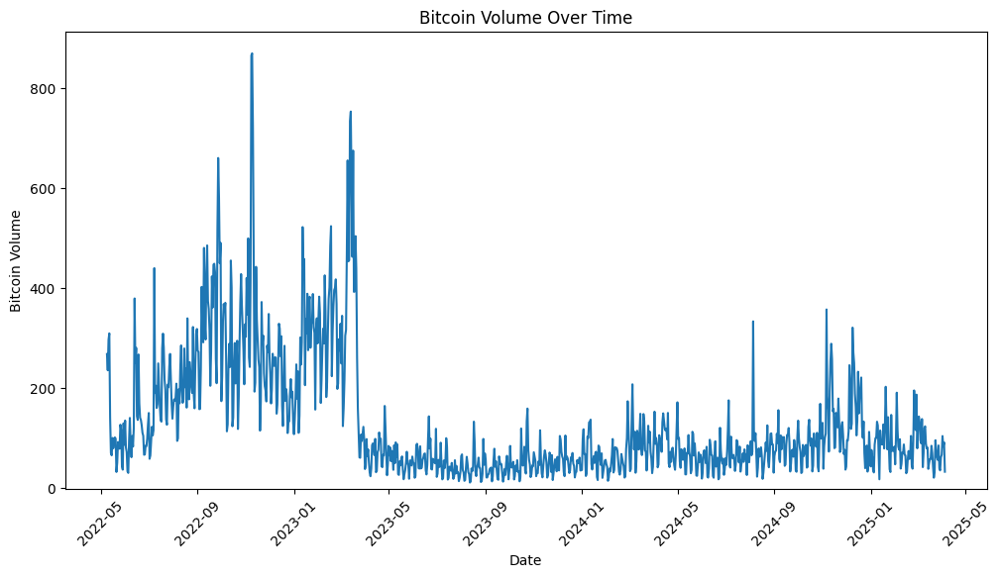

In [40]:
# Plot Bitcoin Volume over date
plt.figure(figsize=(12, 6))
plt.plot(btc_data['Date'], btc_data['Volume'])
plt.xlabel('Date')
plt.ylabel('Bitcoin Volume')
plt.ylim(bottom=-2)  # Set the lower limit to 0
plt.title('Bitcoin Volume Over Time')
plt.xticks(rotation=45)
plt.show()

## **Re-scale and Transformation**

**Yeo-Johnson Transformation** for Price, Change, Pct_Change

In [41]:
# For Price, Change, 7D_Pct_Change, 2D_Pct_Change (use yeo-johnson)
from sklearn.preprocessing import PowerTransformer
import pandas as pd

# Initialize PowerTransformer for each column
power_transformer_price = PowerTransformer(method='yeo-johnson', standardize=False)  # Disable standardization
power_transformer_change = PowerTransformer(method='yeo-johnson', standardize=False)
power_transformer_7d_pct_change = PowerTransformer(method='yeo-johnson', standardize=False)
power_transformer_2d_pct_change = PowerTransformer(method='yeo-johnson', standardize=False)

# Apply the Yeo-Johnson transformation to each column
btc_data['YeoJohnson_Price'] = power_transformer_price.fit_transform(btc_data[['Price']])
btc_data['YeoJohnson_Change'] = power_transformer_change.fit_transform(btc_data[['Change']])
btc_data['YeoJohnson_7D_Pct_Change'] = power_transformer_7d_pct_change.fit_transform(btc_data[['Pct_Change_7D']])
btc_data['YeoJohnson_2D_Pct_Change'] = power_transformer_2d_pct_change.fit_transform(btc_data[['Pct_Change_2D']])

# Store lambda values for each column
lambdas = {
    'Price_lambda': power_transformer_price.lambdas_[0],
    'Change_lambda': power_transformer_change.lambdas_[0],
    'Pct_Change_lambda_7D': power_transformer_7d_pct_change.lambdas_[0],
    'Pct_Change_lambda_2D': power_transformer_2d_pct_change.lambdas_[0]
}

# Calculate mean and standard deviation for each transformed column
transformed_means = {
    'Price_mean': btc_data['YeoJohnson_Price'].mean(),
    'Change_mean': btc_data['YeoJohnson_Change'].mean(),
    'Pct_Change_mean_7D': btc_data['YeoJohnson_7D_Pct_Change'].mean(),
    'Pct_Change_mean_2D': btc_data['YeoJohnson_2D_Pct_Change'].mean()
}

transformed_stds = {
    'Price_std': btc_data['YeoJohnson_Price'].std(),
    'Change_std': btc_data['YeoJohnson_Change'].std(),
    'Pct_Change_std_7D': btc_data['YeoJohnson_7D_Pct_Change'].std(),
    'Pct_Change_std_2D': btc_data['YeoJohnson_2D_Pct_Change'].std()
}

# Print the collected lambdas, means, and standard deviations
print(f"Lambdas: {lambdas}")
print(f"Means: {transformed_means}")
print(f"Standard Deviations: {transformed_stds}")

### Step 2: Back-Transformation ###
# Recreate PowerTransformers with stored lambdas for back-transformation
power_transformer_price.lambdas_ = [lambdas['Price_lambda']]
power_transformer_change.lambdas_ = [lambdas['Change_lambda']]
power_transformer_7d_pct_change.lambdas_ = [lambdas['Pct_Change_lambda_7D']]
power_transformer_2d_pct_change.lambdas_ = [lambdas['Pct_Change_lambda_2D']]

Lambdas: {'Price_lambda': -0.25856407543626825, 'Change_lambda': 0.9883632386260071, 'Pct_Change_lambda_7D': 0.9694157613313893, 'Pct_Change_lambda_2D': 0.9889327709948691}
Means: {'Price_mean': 3.613538576299676, 'Change_mean': 0.10246122324828746, 'Pct_Change_mean_7D': 0.707173658338029, 'Pct_Change_mean_2D': 0.23068683594838912}
Standard Deviations: {'Price_std': 0.03614464554551531, 'Change_std': 2.7643084416385797, 'Pct_Change_std_7D': 7.266554726919817, 'Pct_Change_std_2D': 3.806592926445063}


In [42]:
binary_variables = [
    "MACD_buy",  # 1 if MACD crosses above MACD_Signal, otherwise 0
    "MACD_sell",  # 1 if MACD crosses below MACD_Signal, otherwise 0
    "MACD_above_signal",  # 1 if MACD > MACD_Signal, otherwise 0
    "MACD_below_signal",  # 1 if MACD <= MACD_Signal, otherwise 0
    "BB_Buy",  # 1 if Price crosses below the Lower Bollinger Band, otherwise 0
    "BB_Sell",  # 1 if Price crosses above the Upper Bollinger Band, otherwise 0
    "Price_below_BB_lower",  # 1 if Price < BB_lower, otherwise 0
    "Price_above_BB_upper",  # 1 if Price > BB_upper, otherwise 0
    "VWAP_Buy",  # 1 if Price crosses above VWAP, otherwise 0
    "VWAP_Sell",  # 1 if Price crosses below VWAP, otherwise 0
    "RSI_12_Oversold",  # 1 if RSI_12 < 30, otherwise 0
    "RSI_12_Overbought",  # 1 if RSI_12 > 70, otherwise 0
    "RSI_Divergence",  # 1 if RSI_6 > RSI_12, otherwise 0
    "Positive_7D",  # 1 if Pct_Change_7D > 0, otherwise 0
    "Positive_2D",  # 1 if Pct_Change_2D > 0, otherwise 0
    "Higher_Low",  # 1 if current low > previous low, otherwise 0
    "Breakout",  # 1 if Price > Resistance_Level, otherwise 0
    "Ascending_Triangle_Breakout",  # Same as Breakout
    "Breakout_With_Volume",  # 1 if breakout with volume confirmation, otherwise 0
    "Ascending_Triangle_Breakout_With_Volume",  # Same as Breakout_With_Volume
    "ADX_Buy_Signal",  # 1 if ADX > 25 and Positive_DI > Negative_DI, otherwise 0
    "ADX_Sell_Signal",  # 1 if ADX > 25 and Negative_DI > Positive_DI, otherwise 0
    "Stochastic_Buy_Signal",  # 1 if Stochastic %K < 20 and %K > %D, otherwise 0
    "Stochastic_Sell_Signal",  # 1 if Stochastic %K > 80 and %K < %D, otherwise 0
    "Bullish_Engulfing",  # 1 if Bullish Engulfing pattern is detected, otherwise 0
    "Bearish_Engulfing",  # 1 if Bearish Engulfing pattern is detected, otherwise 0
    "Hammer",  # 1 if Hammer candlestick pattern is detected, otherwise 0
    "Three_White_Soldiers",  # 1 if Three White Soldiers pattern is detected, otherwise 0
    "Three_Black_Crows", # 1 if Three Black Crows pattern is detected, otherwise 0
    'Extreme_Fear', 'Extreme_Greed'
]

In [43]:
continuous_variables = [
    'Price', 'Open', 'High', 'Low', 'Change',
    "RSI_6",  # Relative Strength Index with a 6-period length
    "RSI_12",  # Relative Strength Index with a 12-period length
    "EMA_14",  # Exponential Moving Average with a 14-period length
    "SMA_14",  # Simple Moving Average with a 14-period length
    "OBV",  # On-Balance Volume
    "MACD",  # Moving Average Convergence Divergence
    "MACD_Signal",  # Signal line of MACD
    "MACD_cum_buy",  # Cumulative count of consecutive days where MACD_above_signal is 1
    "MACD_cum_sell",  # Cumulative count of consecutive days where MACD_below_signal is 1
    "BB_upper",  # Upper Bollinger Band
    "BB_lower",  # Lower Bollinger Band
    "BB_cum_Buy",  # Cumulative count of consecutive days where Price_below_BB_lower is 1
    "BB_cum_Sell",  # Cumulative count of consecutive days where Price_above_BB_upper is 1
    "ATR",  # Average True Range
    "ATR_Ratio",  # ATR as a percentage of Price
    "Stop_Loss_Long",  # Stop-loss level for long trades
    "Stop_Loss_Short",  # Stop-loss level for short trades
    "VWAP",  # Volume Weighted Average Price
    "Support",  # Lowest low in the past 20 days
    "Resistance",  # Highest high in the past 20 days
    "Consecutive_RSI_12_Overbought",  # Cumulative count of consecutive days where RSI_12_Overbought is 1
    "Consecutive_RSI_12_Oversold",  # Cumulative count of consecutive days where RSI_12_Oversold is 1
    "Pct_Change_7D",  # Percentage price change over the next 7 days
    "Pct_Change_2D",  # Percentage price change over the next 2 days
    "MA50",  # 50-day moving average
    "MA200",  # 200-day moving average
    "Price_vs_MA50",  # Price relative to 50-day MA (%)
    "Price_vs_MA200",  # Price relative to 200-day MA (%)
    "MA_Distance_Ratio",  # Ratio of MA50 to MA200 distance
    "Avg_Volume_20",  # 20-day average volume
    "Volume_Ratio",  # Current volume / 20-day avg volume
    "OBV_Slope",  # 5-day slope of OBV
    "Resistance_Level",  # Exponential moving average of high price
    "Avg_Volume",  # 7-day rolling average of volume
    "Triangle_Completion",  # Rolling mean of Higher_Low
    "Triangle_Height",  # Height of the triangle as % of price
    "Triangle_Duration",  # Sum of Higher_Low over 7 days
    "Breakout_Strength",  # Volume-adjusted breakout strength
    "ADX",  # Average Directional Index
    "Positive_DI",  # Positive Directional Index
    "Negative_DI",  # Negative Directional Index
    "Consecutive_ADX_Buy",  # Consecutive days of ADX_Buy_Signal
    "Consecutive_ADX_Sell",  # Consecutive days of ADX_Sell_Signal
    "ADX_Strength",  # How far ADX is above the threshold
    "ADX_Trend_Duration",  # Consecutive days where ADX > 25
    "ADX_Trend_Direction",  # Difference between Positive_DI and Negative_DI
    "Stochastic_perK",  # %K line of the Stochastic Oscillator
    "Stochastic_perD",  # %D line of the Stochastic Oscillator
    "Consecutive_Stochastic_Buy",  # Consecutive days of Stochastic_Buy_Signal
    "Consecutive_Stochastic_Sell",  # Consecutive days of Stochastic_Sell_Signal
    "Consecutive_Hammer",  # Consecutive hammer patterns
    "SPY_Price",  # Price of SPY (S&P 500 ETF)
    "SPY_Volume",  # Trading volume of SPY
    "ETH_Price",  # Price of Ethereum (ETH)
    "ETH_Volume",  # Trading volume of Ethereum (ETH)
    "Gold_Price",  # Price of gold
    "Gold_Volume",  # Trading volume of gold
    "US_10Y",  # Yield of the US 10-year Treasury bond
    "Yield_Spread",  # Spread between different bond yields
    "YeoJohnson_Price",  # Yeo-Johnson transformed Price
    "YeoJohnson_Change",  # Yeo-Johnson transformed Change
    "YeoJohnson_7D_Pct_Change",  # Yeo-Johnson transformed Pct_Change_7D
    "YeoJohnson_2D_Pct_Change", # Yeo-Johnson transformed Pct_Change_2D
    'Fear_and_Greed_Index', 'Consecutive_Extreme_Fear', 'Consecutive_Extreme_Greed'
]

In [44]:
# Set binary variables to int64
btc_data[binary_variables] = btc_data[binary_variables].astype("int64")

# Set continuous variables to float64
btc_data[continuous_variables] = btc_data[continuous_variables].astype("float64")

# Verify the data types
for column in btc_data.columns:
    print(f"{column}: {btc_data[column].dtype}")

Date: datetime64[ns]
Price: float64
Open: float64
High: float64
Low: float64
Change: float64
Volume: float64
Day_of_Week: int32
Week_of_Year: UInt32
Month: int32
Quarter: int32
Year: int32
RSI_6: float64
RSI_12: float64
EMA_14: float64
SMA_14: float64
OBV: float64
MACD: float64
MACD_Signal: float64
MACD_buy: int64
MACD_sell: int64
MACD_above_signal: int64
MACD_below_signal: int64
MACD_cum_buy: float64
MACD_cum_sell: float64
BB_upper: float64
BB_lower: float64
BB_Buy: int64
BB_Sell: int64
Price_below_BB_lower: int64
Price_above_BB_upper: int64
BB_cum_Buy: float64
BB_cum_Sell: float64
ATR: float64
Stop_Loss_Long: float64
Stop_Loss_Short: float64
VWAP: float64
VWAP_Buy: int64
VWAP_Sell: int64
Fear_and_Greed_Index: float64
Support: float64
Resistance: float64
Extreme_Fear: int64
Extreme_Greed: int64
RSI_12_Oversold: int64
Consecutive_RSI_12_Oversold: float64
RSI_12_Overbought: int64
RSI_Divergence: int64
Consecutive_Extreme_Fear: float64
Consecutive_Extreme_Greed: float64
Consecutive_RSI_1

In [45]:
numerical_variable = btc_data.select_dtypes(include=['number'])
btc_data.columns

Index(['Date', 'Price', 'Open', 'High', 'Low', 'Change', 'Volume',
       'Day_of_Week', 'Week_of_Year', 'Month',
       ...
       'US_10Y', 'Yield_Spread', 'SPY_Price', 'SPY_Volume', 'ETH_Price',
       'ETH_Volume', 'YeoJohnson_Price', 'YeoJohnson_Change',
       'YeoJohnson_7D_Pct_Change', 'YeoJohnson_2D_Pct_Change'],
      dtype='object', length=113)

**Standardize all numeric variable**

store to scaled_btc_data

In [46]:
# Define count columns
count_columns = [ 'MACD_Signal', 'MACD_buy', 'MACD_sell', 'MACD_above_signal', 'MACD_cum_buy', 'MACD_cum_sell', 'MACD_below_signal', 'BB_Buy', 'BB_Sell', 'Price_below_BB_lower', 'Price_above_BB_upper',
                 'BB_cum_Buy', 'BB_cum_Sell', 'VWAP_Buy', 'VWAP_Sell', 'Price_above_VWAP', 'Price_below_VWAP', 'VWAP_cum_Buy', 'VWAP_cum_Sell', 'RSI12_Oversold' ,'Consecutive_RSI_12_Oversold',
                 'RSI_12_Overbought', 'RSI_Divergence', 'Consecutive_RSI_12_Overbought', 'Ascending_Triangle_Breakout', 'Ascending_Triangle_Breakout_With_Volume', 'ADX_Buy_Signal', 'ADX_Sell_Signal', 'Consecutive_ADX_Buy',
                 'Consecutive_ADX_Sell', 'Stochastic_Buy_Signal', 'Stochastic_Sell_Signal', 'Consecutive_Stochastic_Buy', 'Consecutive_Stochastic_Sell', 'Bullish_Engulfing', 'Bearish_Engulfing', 'Hammer', 'Consecutive_Hammer',
                 'Three_white_soldiers', 'Three_Black_Crows', 'Fear_and_Greed_Index', 'Extreme_Fear', 'Extreme_Greed', 'Consecutive_Extreme_Fear', 'Consecutive_Extreme_Greed'
                 ]

In [47]:
#Standardize all numeric variable
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Initialize the MinMaxScaler and StandardScaler
min_max_scaler = MinMaxScaler()
standard_scaler = StandardScaler()

# Apply log transformation to 'Volume' to reduce the range
btc_data['Volume'] = np.log1p(btc_data['Volume'])  # log1p handles log(0) safely

# Apply Scaler
btc_data['Volume'] = min_max_scaler.fit_transform(btc_data[['Volume']])
btc_data['Volume'] = standard_scaler.fit_transform(btc_data[['Volume']])

# List of features for scaling
numeric_features = continuous_variables

# Fit and transform only the numeric features
scaled_features = standard_scaler.fit_transform(btc_data[numeric_features])

# Create a new DataFrame for scaled data
scaled_btc_data = btc_data.copy()  # Copy original DataFrame

# Replace numeric columns in the new DataFrame with scaled values
scaled_btc_data[numeric_features] = scaled_features

scaled_btc_data.tail()

,Date,Price,Open,High,Low,Change,Volume,Day_of_Week,Week_of_Year,Month,Quarter,Year,RSI_6,RSI_12,EMA_14,SMA_14,OBV,MACD,MACD_Signal,MACD_buy,MACD_sell,MACD_above_signal,MACD_below_signal,MACD_cum_buy,MACD_cum_sell,BB_upper,BB_lower,BB_Buy,BB_Sell,Price_below_BB_lower,Price_above_BB_upper,BB_cum_Buy,BB_cum_Sell,ATR,Stop_Loss_Long,Stop_Loss_Short,VWAP,VWAP_Buy,VWAP_Sell,Fear_and_Greed_Index,Support,Resistance,Extreme_Fear,Extreme_Greed,RSI_12_Oversold,Consecutive_RSI_12_Oversold,RSI_12_Overbought,RSI_Divergence,Consecutive_Extreme_Fear,Consecutive_Extreme_Greed,Consecutive_RSI_12_Overbought,ATR_Ratio,MA50,MA200,Price_vs_MA50,Price_vs_MA200,MA_Distance_Ratio,Avg_Volume_20,Volume_Ratio,OBV_Slope,Pct_Change_7D,Pct_Change_2D,Positive_7D,Positive_2D,Resistance_Level,Low_Shifted,Higher_Low,Breakout,Ascending_Triangle_Breakout,Avg_Volume,Breakout_With_Volume,Ascending_Triangle_Breakout_With_Volume,Triangle_Completion,Triangle_Height,Triangle_Duration,Breakout_Strength,ADX,Positive_DI,Negative_DI,ADX_Buy_Signal,ADX_Sell_Signal,Consecutive_ADX_Buy,Consecutive_ADX_Sell,ADX_Strength,ADX_Trend_Duration,ADX_Trend_Direction,Stochastic_perK,Stochastic_perD,Stochastic_Buy_Signal,Stochastic_Sell_Signal,Consecutive_Stochastic_Buy,Consecutive_Stochastic_Sell,Bullish_Engulfing,Bearish_Engulfing,Hammer,Consecutive_Hammer,Body,Upper_Shadow,Lower_Shadow,Three_White_Soldiers,Three_Black_Crows,Gold_Price,Gold_Volume,US_10Y,Yield_Spread,SPY_Price,SPY_Volume,ETH_Price,ETH_Volume,YeoJohnson_Price,YeoJohnson_Change,YeoJohnson_7D_Pct_Change,YeoJohnson_2D_Pct_Change
4108,2025-04-01,1.5308,1.4326,1.4827,1.4951,1.1022,-0.3546,1,14,4,2,2025,0.1378,-0.1890,1.5391,1.5550,0.3414,-0.7926,-0.9221,0,0,1,0,1.4675,-0.6499,1.4279,1.6659,0,0,0,0,-0.1738,-0.2330,1.2461,1.5454,1.5166,1.5032,1,0,-0.7820,1.6968,1.4280,0,0,0,-0.1697,0,1,-0.2146,-0.1475,-0.2824,-0.0603,1.7627,2.3210,-0.4651,-0.3735,0.0854,-0.1210,0.2391,0.0485,NaN,-0.6870,0,0,1.4924,81300.1000,1,0,0,-0.0663,1,1,-2.2623,-0.4144,-2.2623,0.0722,-0.6162,-0.5419,0.0990,0,0,-0.4831,-0.4000,-0.7047,-0.7475,-0.3543,-0.0710,-0.9429,0,0,-0.2031,-0.2633,0,0,0,-0.1658,2615.6000,342.0000,112.8000,0,0,NaN,NaN,0.4292,1.6695,1.2220,-0.7373,-0.4147,0.1628,1.3440,1.0986,NaN,-0.6843
4109,2025-04-02,1.4285,1.5341,1.5918,1.4920,-1.1656,0.1752,2,14,4,2,2025,-0.6881,-0.6511,1.5282,1.5429,0.2608,-0.8472,-0.9151,0,0,1,0,1.5859,-0.6499,1.4227,1.6779,0,0,0,0,-0.1738,-0.2330,1.4224,1.4171,1.4366,1.5052,0,1,-0.2967,1.7350,1.4280,0,0,0,-0.1697,0,0,-0.2146,-0.1475,-0.2824,0.2369,1.7521,2.3267,-0.6882,-0.4890,0.0689,-0.1210,1.3860,0.0485,NaN,0.3578,0,1,1.5206,82435.8000,0,0,0,-0.0663,1,1,-2.2623,0.0040,-2.2623,0.0722,-0.7034,-0.1241,-0.2399,0,0,-0.4831,-0.4000,-0.7047,-0.7475,0.0472,-1.3049,-0.9354,0,0,-0.2031,-0.2633,0,1,0,-0.1658,-2641.0000,3211.3000,166.1000,0,0,NaN,NaN,0.4886,1.6420,1.2667,0.0477,-0.5562,0.8199,1.2975,-1.1704,NaN,0.3640
4110,2025-04-03,1.4531,1.4316,1.4220,1.4506,0.2341,-0.0925,3,14,4,2,2025,-0.4465,-0.5177,1.5221,1.5400,0.3252,-0.8509,-0.9102,0,0,1,0,1.7043,-0.6499,1.4229,1.6743,0,0,0,0,-0.1738,-0.2330,1.3725,1.4487,1.4552,1.4421,1,0,-1.2189,1.7496,1.4280,0,0,0,-0.1697,0,0,-0.2146,-0.1475,-0.2824,0.1554,1.7402,2.3327,-0.6027,-0.4671,0.0463,-0.1210,0.7149,0.0485,NaN,0.0549,0,1,1.4990,82358.9000,0,0,0,-0.0663,0,0,-2.2623,0.0905,-2.2623,0.0722,-0.8200,-0.2541,-0.0871,0,0,-0.4831,-0.4000,-0.7047,-0.7475,-0.1009,-1.0083,-0.8510,0,0,-0.2031,-0.2633,0,0,0,-0.1658,636.8000,749.5000,1208.8000,0,0,NaN,NaN,0.2114,1.8071,0.9164,1.8801,-0.5303,0.3526,1.3088,0.2406,NaN,0.0632
4111,2025-04-04,1.4805,1.4563,1.4522,1.4656,0.2631,0.0222,4,14,4,2,2025,-0.1749,-0.3672,1.5205,1.5394,0.3962,-0.8110,-0.8979,0,0,1,0,1.8227,-0.6499,1.4224,1.6728,0,0,0,0,-0.1738,-0.2330,1.3523,1.4805,1.4789,1.4664,0,0,-1.0733,1.7496,1.4280,0,0,0,-0.1697,0,1,-0.2146,-0.1475,-0.2824,0.1053,1.7299,2.3391,-0.5133,-0.4424,0.0255,-0.1210,0.8604,0.0485,NaN,NaN,0,0,1.4904,81313.8000,1,0,0,-0.0663,0,0,-1.5115,-0.0058,-1.5115,0.0722,-0.9026,-0.2101,-0.2488,0,0,-0.4831,-0.4

In [48]:
#numeric_features = [
  #'Price', 'Open', 'High', 'Low', 'Change', 'RSI_6', 'RSI_12', 'EMA_14',
  #'SMA_14', 'OBV', 'MACD', 'MACD_Signal','MACD_above_signal', 'MACD_below_signal','MACD_cum_buy', 'MACD_cum_sell',
  #'BB_lower', 'BB_upper','Price_below_BB_lower', 'Price_above_BB_upper', 'BB_cum_Buy', 'BB_cum_Sell',
  #'ATR', 'Stop_Loss_Long', 'Stop_Loss_Short', 'VWAP','Support', 'Resistance', 'YeoJohnson_Price',
  #'YeoJohnson_Change','YeoJohnson_7D_Pct_Change', 'YeoJohnson_2D_Pct_Change', 'Gold_Price', 'Gold_Volume',
  #'US_10Y', 'Yield_Spread','Triangle_Completion', 'Triangle_Height', 'Breakout_Strength',
  #'ADX_Strength', 'ATR_Ratio', 'Price_vs_MA50', 'Price_vs_MA200', 'MA_Distance_Ratio', 'OBV_Slope',
  #'Stochastic_perK', 'Stochastic_perD', 'SPY_Price', 'SPY_Volume', 'ETH_Price', 'ETH_Volume',
  #'Fear_and_Greed_Index', 'Extreme_Fear', 'Extreme_Greed', 'Consecutive_Extreme_Fear', 'Consecutive_Extreme_Greed']

In [49]:
scaled_btc_data.describe().T

,count,mean,min,25%,50%,75%,max,std
Date,1063,2023-10-22 00:00:00,2022-05-09 00:00:00,2023-01-29 12:00:00,2023-10-22 00:00:00,2024-07-13 12:00:00,2025-04-05 00:00:00,NaN
Price,1063.0000,0.0000,-1.1578,-0.8278,-0.5371,0.7501,2.3442,1.0005
Open,1063.0000,0.0000,-1.1570,-0.8267,-0.5359,0.7505,2.3482,1.0005
High,1063.0000,0.0000,-1.1489,-0.8197,-0.4665,0.7575,2.3844,1.0005
Low,1063.0000,-0.0000,-1.1580,-0.8316,-0.5573,0.7402,2.4034,1.0005
...,...,...,...,...,...,...,...,...
ETH_Volume,1063.0000,-0.0000,-1.2890,-0.6300,-0.2484,0.2922,9.1043,1.0005
YeoJohnson_Price,1063.0000,-0.0000,-1.7630,-0.8344,-0.3058,0.9329,1.6589,1.0005
YeoJohnson_Change,1063.0000,0.0000,-5.8267,-0.4463,-0.0479,0.4613,4.1961,1.0005
YeoJohnson_7D_Pct_Change,1056.0000,0.0000,-5.0470,-0.5034,-0.0510,0.4716,4.4531,1.0005


# **Please use scaled_btc_data for analysis**

In [50]:
scaled_btc_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1063 entries, 3050 to 4112
Columns: 113 entries, Date to YeoJohnson_2D_Pct_Change
dtypes: UInt32(1), datetime64[ns](1), float64(76), int32(4), int64(31)
memory usage: 927.0 KB


**Drop NA before Analysis**

In [51]:
# Drop rows with NaN values in scaled_btc_data
scaled_btc_data = scaled_btc_data.dropna()

# Optionally, reset the index after dropping rows
scaled_btc_data = scaled_btc_data.reset_index(drop=True)

In [52]:
scaled_btc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1002 entries, 0 to 1001
Columns: 113 entries, Date to YeoJohnson_2D_Pct_Change
dtypes: UInt32(1), datetime64[ns](1), float64(76), int32(4), int64(31)
memory usage: 866.1 KB


In [53]:
#Check data are consecutive
# Ensure 'Date' is sorted
scaled_btc_data = scaled_btc_data.sort_values('Date')

# Calculate the difference between consecutive dates
scaled_btc_data['Date_Diff'] = scaled_btc_data['Date'].diff().dt.days

# Check if all differences are 1 day
if (scaled_btc_data['Date_Diff'].iloc[1:] == 1).all():
    print("All dates are consecutive.")
else:
    print("There are missing dates.")
    print(scaled_btc_data[scaled_btc_data['Date_Diff'] > 1])  # Display rows with missing dates

# Drop the 'Date_Diff' column after the check
scaled_btc_data.drop(columns=['Date_Diff'], inplace=True)

All dates are consecutive.


In [54]:
# Check the start and end dates
start_date = scaled_btc_data['Date'].min()
end_date = scaled_btc_data['Date'].max()

print(f"Data starts from: {start_date}")
print(f"Data ends at: {end_date}")

Data starts from: 2022-05-09 00:00:00
Data ends at: 2025-02-03 00:00:00


#Exploratory Data Analysis

In [55]:
#Print the name of the columns
print(scaled_btc_data.columns)

Index(['Date', 'Price', 'Open', 'High', 'Low', 'Change', 'Volume',
       'Day_of_Week', 'Week_of_Year', 'Month',
       ...
       'US_10Y', 'Yield_Spread', 'SPY_Price', 'SPY_Volume', 'ETH_Price',
       'ETH_Volume', 'YeoJohnson_Price', 'YeoJohnson_Change',
       'YeoJohnson_7D_Pct_Change', 'YeoJohnson_2D_Pct_Change'],
      dtype='object', length=113)


In [56]:
# Moving date to index
scaled_btc_data.set_index('Date', inplace=True)

target = 'YeoJohnson_7D_Pct_Change'
# target_binary = 'Positive_2D'
target_binary = 'Positive_7D'

exclude_list = ['Price', 'Open', 'High', 'Low', 'Change', 'Day_of_Week', 'Week_of_Year', 'Month','Quarter','Year',
                'VWAP', 'VWAP_Buy', 'VWAP_Sell', 'Resistance_Level', 'Low_Shifted', 'Higher_Low',
                'Breakout', 'Ascending_Triangle_Breakout', 'Avg_Volume', 'Breakout_With_Volume', 'Avg_Volume_20','Pct_Change_7D', 'Pct_Change_2D','Positive_2D','YeoJohnson_Price','YeoJohnson_Change','YeoJohnson_2D_Pct_Change']
# Select binary columns
binary_variables = scaled_btc_data.drop(columns=exclude_list+[target,target_binary]).select_dtypes(include=['int64']).columns.tolist()

# Identify 2-dimensional columns
for column in binary_variables:
    if len(scaled_btc_data[column].shape) != 1:  # Check if the column is not 1D
        print(f"Column '{column}' is 2-dimensional with shape {scaled_btc_data[column].shape}")

# Filter out 2D columns and remove target from predictors
binary_variables = [col for col in binary_variables if len(scaled_btc_data[col].shape) == 1 and col != target]


# Define predictors, all columns except the 7D_Pct_Change or YeoJohnson_7D_Pct_Change or 2D_Pct_Change or YeoJohnson_2D_Pct_Change
predictors = scaled_btc_data.drop(columns=[target, target_binary] + exclude_list + binary_variables, axis=1).columns.tolist()

# Display the first few rows of the DataFrame
scaled_btc_data.head()

,Price,Open,High,Low,Change,Volume,Day_of_Week,Week_of_Year,Month,Quarter,Year,RSI_6,RSI_12,EMA_14,SMA_14,OBV,MACD,MACD_Signal,MACD_buy,MACD_sell,MACD_above_signal,MACD_below_signal,MACD_cum_buy,MACD_cum_sell,BB_upper,BB_lower,BB_Buy,BB_Sell,Price_below_BB_lower,Price_above_BB_upper,BB_cum_Buy,BB_cum_Sell,ATR,Stop_Loss_Long,Stop_Loss_Short,VWAP,VWAP_Buy,VWAP_Sell,Fear_and_Greed_Index,Support,Resistance,Extreme_Fear,Extreme_Greed,RSI_12_Oversold,Consecutive_RSI_12_Oversold,RSI_12_Overbought,RSI_Divergence,Consecutive_Extreme_Fear,Consecutive_Extreme_Greed,Consecutive_RSI_12_Overbought,ATR_Ratio,MA50,MA200,Price_vs_MA50,Price_vs_MA200,MA_Distance_Ratio,Avg_Volume_20,Volume_Ratio,OBV_Slope,Pct_Change_7D,Pct_Change_2D,Positive_7D,Positive_2D,Resistance_Level,Low_Shifted,Higher_Low,Breakout,Ascending_Triangle_Breakout,Avg_Volume,Breakout_With_Volume,Ascending_Triangle_Breakout_With_Volume,Triangle_Completion,Triangle_Height,Triangle_Duration,Breakout_Strength,ADX,Positive_DI,Negative_DI,ADX_Buy_Signal,ADX_Sell_Signal,Consecutive_ADX_Buy,Consecutive_ADX_Sell,ADX_Strength,ADX_Trend_Duration,ADX_Trend_Direction,Stochastic_perK,Stochastic_perD,Stochastic_Buy_Signal,Stochastic_Sell_Signal,Consecutive_Stochastic_Buy,Consecutive_Stochastic_Sell,Bullish_Engulfing,Bearish_Engulfing,Hammer,Consecutive_Hammer,Body,Upper_Shadow,Lower_Shadow,Three_White_Soldiers,Three_Black_Crows,Gold_Price,Gold_Volume,US_10Y,Yield_Spread,SPY_Price,SPY_Volume,ETH_Price,ETH_Volume,YeoJohnson_Price,YeoJohnson_Change,YeoJohnson_7D_Pct_Change,YeoJohnson_2D_Pct_Change
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-05-09,-0.6030,-0.4487,-0.4665,-0.5796,-4.2545,1.3104,0,19,5,2,2022,-2.0564,-2.0838,-0.3461,-0.3220,3.2337,-1.4288,-1.0703,0,0,0,1,-0.6636,-0.1125,-0.2178,-0.3559,0,0,1,0,7.7233,-0.2330,0.1165,-0.6674,-0.5476,-0.5491,0,0,-1.8984,-0.4675,-0.2318,1,0,1,0.7846,0,0,0.0249,-0.1475,-0.2824,2.0272,-0.1360,0.2646,-2.4021,-1.6013,-0.7667,11.6897,-1.9344,-27.1277,-0.2409,-0.9647,0,0,-0.3702,33727.0000,0,0,0,20.0647,0,0,-2.2623,1.7376,-2.2623,-14.8437,0.1850,-1.4023,2.2937,0,1,-0.4831,1.3130,-0.0351,0.0630,-1.9131,-1.8776,-1.8088,0,0,-0.2031,-0.2633,0,0,0,-0.1658,-3946.0000,186.0000,0.0000,0,0,-0.7365,0.1025,-1.7886,2.0549,-1.0428,2.9655,0.0317,3.7185,-0.4107,-4.3369,-0.2110,-0.9665
2022-05-10,-0.5676,-0.6016,-0.5275,-0.5901,1.0516,1.1552,1,19,5,2,2022,-1.5909,-1.7568,-0.3750,-0.3419,3.4163,-1.5928,-1.1899,0,0,0,1,-0.6636,-0.0051,-0.2144,-0.4037,0,0,1,0,9.3027,-0.2330,0.1721,-0.6343,-0.5104,-0.5615,0,0,-1.9469,-0.4790,-0.2318,1,0,1,1.7388,0,0,0.1446,-0.1475,-0.2824,2.0433,-0.1441,0.2569,-2.1896,-1.5219,-0.7525,11.2075,-1.9344,-16.0070,-0.3803,-1.7890,0,0,-0.4090,30095.0000,0,0,0,18.1252,0,0,-2.2623,2.2923,-2.2623,-13.7300,0.3574,-1.5102,1.9204,0,1,-0.4831,1.4448,0.1758,0.1253,-1.7914,-1.4898,-1.8142,1,0,2.7148,-0.2633,0,0,0,-0.1658,909.3000,1613.7000,267.2000,0,0,-0.7865,0.0310,-1.9074,1.8622,-1.0317,2.1189,0.1511,3.4689,-0.3535,1.0487,-0.3552,-1.8081
2022-05-11,-0.6427,-0.5663,-0.5468,-0.6692,-2.3049,1.4332,2,19,5,2,2022,-1.8380,-1.9914,-0.4102,-0.3703,3.1862,-1.8019,-1.3293,0,0,0,1,-0.6636,0.1024,-0.2019,-0.4664,0,0,1,0,10.8821,-0.2330,0.3165,-0.7300,-0.5679,-0.6189,0,0,-1.8498,-0.5656,-0.3107,1,0,1,2.6931,0,0,0.2644,-0.1475,-0.2824,2.8514,-0.1549,0.2486,-2.5408,-1.6664,-0.8166,10.5865,-1.9344,-8.2685,-0.3099,0.1262,0,1,-0.4428,29831.0000,0,0,0,14.4729,0,0,-3.0130,3.1040,-3.0130,-15.5428,0.5525,-1.6472,2.1208,0,1,-0.4831,1.5765,0.4145,0.1877,-1.9667,-1.5359,-1.7509,1,0,5.6327,-0.2633,0,1,0,-0.1658,-1939.8000,1105.6000,1232.7000,0,0,-0.7423,-0.0298,-2.0658,1.5319,-1.1081,2.4806,0.1511,3.4689,-0.4778,-2.3336,-0.2822,0.1342
2022-05-12,-0.6463,-0.6413,-0.6220,-0.7221,-0.1601,1.4831,3,19,5,2,2022,-1.8490,-2.0020,-0.4412,-0.4004,2.9464,-1.9519,-1.4722,0,0,0,1,-0.6636,0.2099,-0.1953,-0.5196,0,0,1,0,12.4616,-0.2330,0.4106,-0.7430,-0.5635,-0.6629,1,0,-1.8498,-0.6236,-0.3115,1,0,1,3.6473,0,0,0.3841,-0.

In [57]:
# Check the predictors
predictors

['Volume',
 'RSI_6',
 'RSI_12',
 'EMA_14',
 'SMA_14',
 'OBV',
 'MACD',
 'MACD_Signal',
 'MACD_cum_buy',
 'MACD_cum_sell',
 'BB_upper',
 'BB_lower',
 'BB_cum_Buy',
 'BB_cum_Sell',
 'ATR',
 'Stop_Loss_Long',
 'Stop_Loss_Short',
 'Fear_and_Greed_Index',
 'Support',
 'Resistance',
 'Consecutive_RSI_12_Oversold',
 'Consecutive_Extreme_Fear',
 'Consecutive_Extreme_Greed',
 'Consecutive_RSI_12_Overbought',
 'ATR_Ratio',
 'MA50',
 'MA200',
 'Price_vs_MA50',
 'Price_vs_MA200',
 'MA_Distance_Ratio',
 'Volume_Ratio',
 'OBV_Slope',
 'Triangle_Completion',
 'Triangle_Height',
 'Triangle_Duration',
 'Breakout_Strength',
 'ADX',
 'Positive_DI',
 'Negative_DI',
 'Consecutive_ADX_Buy',
 'Consecutive_ADX_Sell',
 'ADX_Strength',
 'ADX_Trend_Duration',
 'ADX_Trend_Direction',
 'Stochastic_perK',
 'Stochastic_perD',
 'Consecutive_Stochastic_Buy',
 'Consecutive_Stochastic_Sell',
 'Consecutive_Hammer',
 'Body',
 'Upper_Shadow',
 'Lower_Shadow',
 'Gold_Price',
 'Gold_Volume',
 'US_10Y',
 'Yield_Spread',
 'SPY

##Univariate Analysis

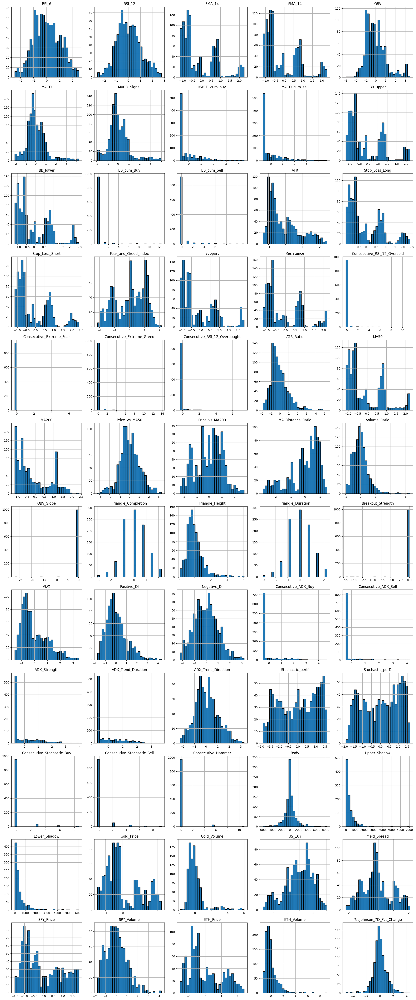

In [58]:
import math

cols = predictors[1:] + [target]
ncols = 5
nrows = math.ceil(len(cols) / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 4 * nrows))
axes = axes.flatten()

for ax, col in zip(axes, cols):
    scaled_btc_data[col].hist(
        bins=30,
        ax=ax,
        edgecolor='black'
    )
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('')

# turn off any unused subplots
for ax in axes[len(cols):]:
    fig.delaxes(ax)

plt.tight_layout()
plt.show()

##Bivariate Analysis

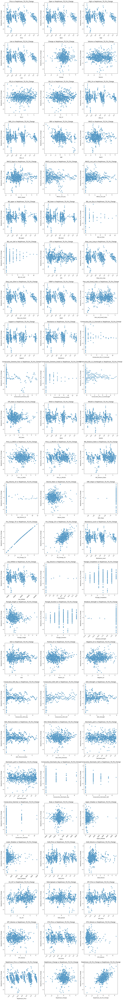

In [59]:
# Select numeric columns
numeric_variables = scaled_btc_data.select_dtypes(include=['float64']).columns.tolist()

# Identify 2-dimensional columns
for column in numeric_variables:
    if len(scaled_btc_data[column].shape) != 1:  # Check if the column is not 1D
        print(f"Column '{column}' is 2-dimensional with shape {scaled_btc_data[column].shape}")

# Filter out 2D columns and remove target from predictors
numeric_variables = [col for col in numeric_variables if len(scaled_btc_data[col].shape) == 1 and col != target]

# Drop rows with missing values
data_numeric = scaled_btc_data[numeric_variables + [target]].dropna()

# Define number of rows and columns for the subplot grid
n_cols = 3
n_rows = (len(numeric_variables) + n_cols - 1) // n_cols  # Ceiling division

# Create figure with subplots
fig = plt.figure(figsize=(15, 5 * n_rows))

# Create scatter plots
for i, column in enumerate(numeric_variables, 1):
    ax = plt.subplot(n_rows, n_cols, i)
    sns.scatterplot(data=data_numeric, x=column, y=target, ax=ax)
    ax.set_title(f"{column} vs {target}")
    ax.set_xlabel(column)
    ax.set_ylabel(target)

    # Rotate x-axis labels if they're too long
    plt.xticks(rotation=45)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

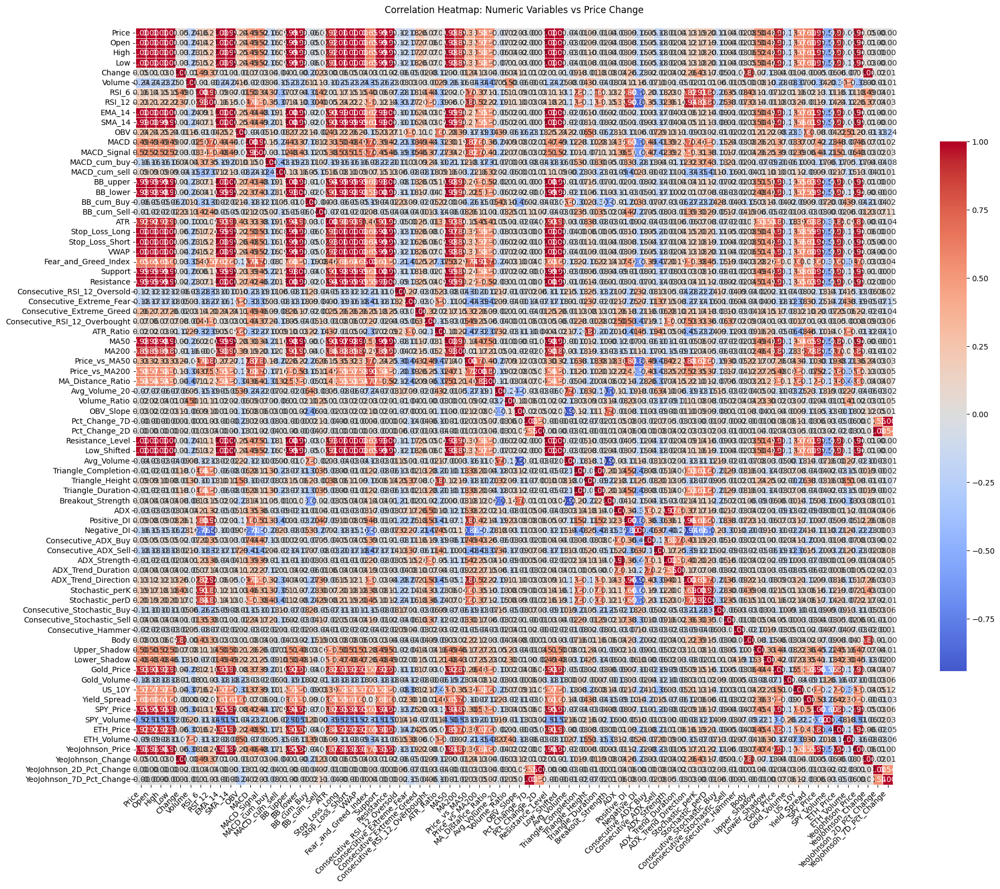

In [60]:
# Create correlation matrix
correlation_matrix = data_numeric.corr()

plt.figure(figsize=(20, 20))

# Create heatmap with annotations
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            square=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap: Numeric Variables vs Price Change', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()

plt.show()

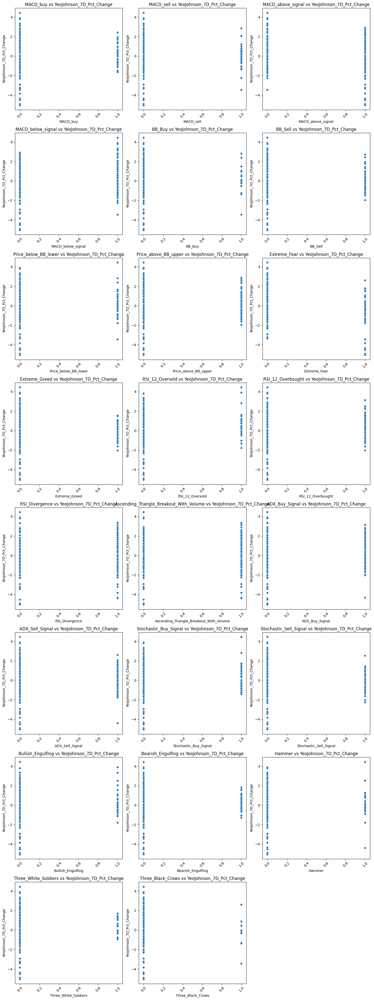

In [61]:
# Drop rows with missing values
data_binary = scaled_btc_data[binary_variables + [target]].dropna()

# Define number of rows and columns for the subplot grid
n_cols = 3
n_rows = (len(binary_variables) + n_cols - 1) // n_cols  # Ceiling division

# Create figure with subplots
fig = plt.figure(figsize=(15, 5 * n_rows))

# Create scatter plots
for i, column in enumerate(binary_variables, 1):
    ax = plt.subplot(n_rows, n_cols, i)
    sns.scatterplot(data=data_binary, x=column, y=target, ax=ax)
    ax.set_title(f"{column} vs {target}")
    ax.set_xlabel(column)
    ax.set_ylabel(target)

    # Rotate x-axis labels if they're too long
    plt.xticks(rotation=45)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

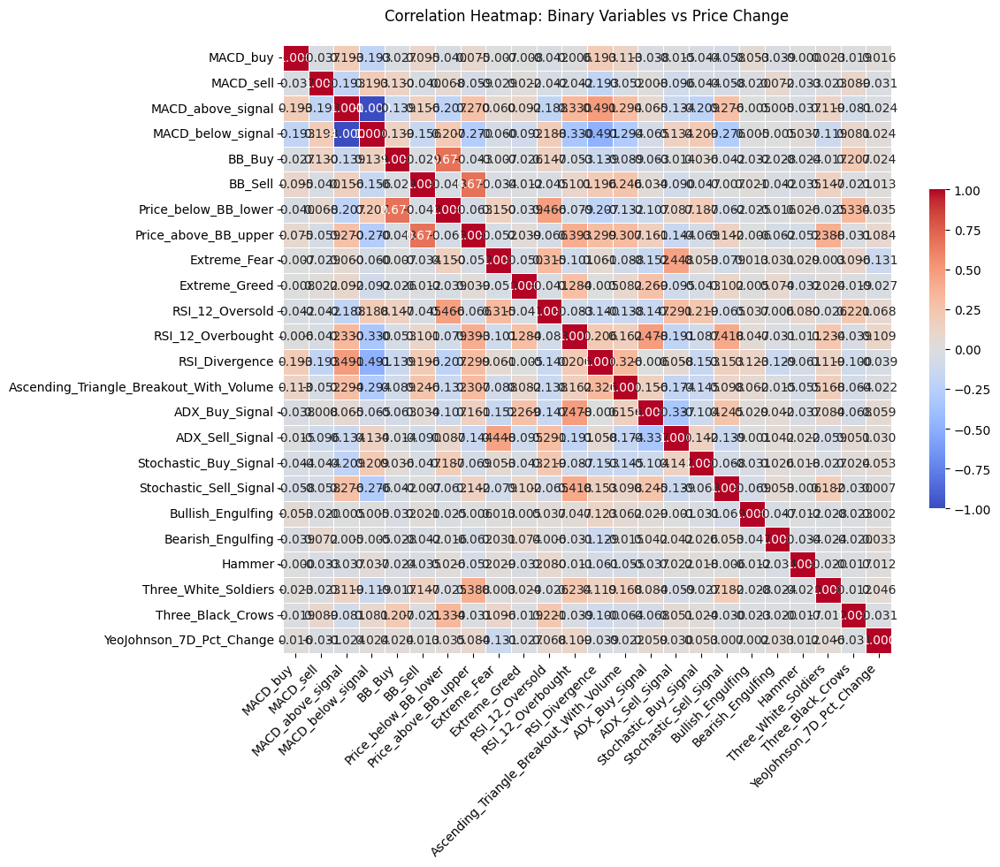

In [62]:
# Create correlation matrix
correlation_matrix = data_binary.corr()

plt.figure(figsize=(12, 10))

# Create heatmap with annotations
sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            square=True,
            fmt='.3f',
            linewidths=0.5,
            cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap: Binary Variables vs Price Change', pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()

plt.show()

# Model Building

- Time-Based Splitting
- Selecting predictors
- Interaction terms

In [63]:
from itertools import chain, combinations

def gen_combinations(input):
    return sum([list(map(list, combinations(input, i))) for i in range(1,len(input) + 1)], [])

def gen_interactions(X,de,pname):
    s = gen_combinations(range(len(pname)))
    VX = []
    VarX = []
    for i in range(len(s)):
        if len(s[i]) <= de:
            VX.append(np.prod(X[:,s[i]],axis=1))
            VarX.append(list([pname[x] for x in s[i]]))
    VarX2 = []
    for x in VarX:
        if len(x) > 1:
            VarX2.append('_'.join(x))
        else:
            VarX2.append(x[0])
    VX = pd.DataFrame(np.array(VX).T,columns=VarX2)
    return VX, VarX2



In [64]:
import pandas as pd
import itertools

# Define feature groups
feature_groups = {
    'Group 1': [
        'Negative_DI', 'Positive_DI', 'ADX_Buy_Signal', 'ADX_Sell_Signal', 'ADX_Strength',
        'ADX_Trend_Direction', 'ADX_Trend_Duration', 'ADX'
    ],
    'Group 2': [
        'Ascending_Triangle_Breakout_With_Volume', 'Triangle_Completion', 'Triangle_Duration', 'Triangle_Height'
    ],
    'Group 3': [
        'ATR_Ratio', 'ATR'
    ],
    'Group 4': [
        'BB_Buy', 'BB_cum_Buy', 'BB_cum_Sell', 'BB_lower', 'BB_Sell', 'BB_upper',
        'Price_above_BB_upper', 'Price_below_BB_lower'
    ],
    'Group 7': [
        'Consecutive_RSI_12_Overbought', 'Consecutive_RSI_12_Oversold', 'RSI_12_Overbought',
        'RSI_12_Oversold', 'RSI_12', 'RSI_6', 'RSI_Divergence'
    ],
    'Group 8': [
        'Consecutive_Stochastic_Buy', 'Consecutive_Stochastic_Sell', 'Stochastic_perD',
        'Stochastic_perK', 'Stochastic_Buy_Signal', 'Stochastic_Sell_Signal'
    ],
    'Group 11': [
        'MA_Distance_Ratio', 'MA200', 'MA50', 'MACD_above_signal', 'MACD_below_signal',
        'MACD_buy', 'MACD_cum_buy', 'MACD_cum_sell', 'MACD_sell', 'MACD_Signal',
        'MACD', 'Price_vs_MA200', 'Price_vs_MA50'
    ],
    'Group 12': [
        'OBV_Slope', 'OBV', 'Resistance', 'Support', 'Volume_Ratio', 'Volume'
    ],
    'Group 13': [
        'SPY_Price', 'SPY_Volume'
    ],
    'Group 14': [
        'US_10Y', 'Yield_Spread','Fear_and_Greed_Index', 'Extreme_Fear', 'Extreme_Greed', 'Consecutive_Extreme_Fear', 'Consecutive_Extreme_Greed'
    ],
    'Group 15': [
        'Gold_Price', 'Gold_Volume'
    ],
    'Group 16': [
        'ETH_Price', 'ETH_Volume'
    ]
}

# Define interaction rules (between groups)
interaction_rules = [
    ('Group 1', 'Group 2'),  # ADX x Triangle Patterns
    ('Group 3', 'Group 4'),  # ATR x Bollinger Bands
    ('Group 7', 'Group 8'),  # RSI x Stochastic Oscillator
    ('Group 11', 'Group 12'),  # MACD x Volume and Support/Resistance
    ('Group 14', 'Group 13'),  # Macro Indicators x SPY
    ('Group 15', 'Group 16')  # Gold x ETH
]

# Initialize an empty DataFrame for interaction terms
interaction_terms = pd.DataFrame(index=scaled_btc_data.index)

# Generate between-group interaction terms
for group_a, group_b in interaction_rules:
    print(f"Generating interactions between {group_a} and {group_b}...")
    features_a = feature_groups[group_a]
    features_b = feature_groups[group_b]
    for feature_a, feature_b in itertools.product(features_a, features_b):  # All combinations between groups
        interaction_name = f"{feature_a}_x_{feature_b}"
        interaction_terms[interaction_name] = scaled_btc_data[feature_a] * scaled_btc_data[feature_b]


interaction_list = interaction_terms.columns.tolist()
# Add interaction terms to the original DataFrame
scaled_btc_data_with_interactions = scaled_btc_data.join(interaction_terms)

scaled_btc_data_with_interactions

Generating interactions between Group 1 and Group 2...
Generating interactions between Group 3 and Group 4...
Generating interactions between Group 7 and Group 8...
Generating interactions between Group 11 and Group 12...
Generating interactions between Group 14 and Group 13...
Generating interactions between Group 15 and Group 16...


,Price,Open,High,Low,Change,Volume,Day_of_Week,Week_of_Year,Month,Quarter,Year,RSI_6,RSI_12,EMA_14,SMA_14,OBV,MACD,MACD_Signal,MACD_buy,MACD_sell,MACD_above_signal,MACD_below_signal,MACD_cum_buy,MACD_cum_sell,BB_upper,BB_lower,BB_Buy,BB_Sell,Price_below_BB_lower,Price_above_BB_upper,BB_cum_Buy,BB_cum_Sell,ATR,Stop_Loss_Long,Stop_Loss_Short,VWAP,VWAP_Buy,VWAP_Sell,Fear_and_Greed_Index,Support,Resistance,Extreme_Fear,Extreme_Greed,RSI_12_Oversold,Consecutive_RSI_12_Oversold,RSI_12_Overbought,RSI_Divergence,Consecutive_Extreme_Fear,Consecutive_Extreme_Greed,Consecutive_RSI_12_Overbought,ATR_Ratio,MA50,MA200,Price_vs_MA50,Price_vs_MA200,MA_Distance_Ratio,Avg_Volume_20,Volume_Ratio,OBV_Slope,Pct_Change_7D,Pct_Change_2D,Positive_7D,Positive_2D,Resistance_Level,Low_Shifted,Higher_Low,Breakout,Ascending_Triangle_Breakout,Avg_Volume,Breakout_With_Volume,Ascending_Triangle_Breakout_With_Volume,Triangle_Completion,Triangle_Height,Triangle_Duration,Breakout_Strength,ADX,Positive_DI,Negative_DI,ADX_Buy_Signal,ADX_Sell_Signal,Consecutive_ADX_Buy,Consecutive_ADX_Sell,ADX_Strength,ADX_Trend_Duration,ADX_Trend_Direction,Stochastic_perK,Stochastic_perD,Stochastic_Buy_Signal,Stochastic_Sell_Signal,Consecutive_Stochastic_Buy,Consecutive_Stochastic_Sell,Bullish_Engulfing,Bearish_Engulfing,Hammer,Consecutive_Hammer,Body,Upper_Shadow,Lower_Shadow,Three_White_Soldiers,Three_Black_Crows,Gold_Price,Gold_Volume,US_10Y,Yield_Spread,SPY_Price,SPY_Volume,ETH_Price,ETH_Volume,YeoJohnson_Price,YeoJohnson_Change,YeoJohnson_7D_Pct_Change,YeoJohnson_2D_Pct_Change,Negative_DI_x_Ascending_Triangle_Breakout_With_Volume,Negative_DI_x_Triangle_Completion,Negative_DI_x_Triangle_Duration,Negative_DI_x_Triangle_Height,Positive_DI_x_Ascending_Triangle_Breakout_With_Volume,Positive_DI_x_Triangle_Completion,Positive_DI_x_Triangle_Duration,Positive_DI_x_Triangle_Height,ADX_Buy_Signal_x_Ascending_Triangle_Breakout_With_Volume,ADX_Buy_Signal_x_Triangle_Completion,ADX_Buy_Signal_x_Triangle_Duration,ADX_Buy_Signal_x_Triangle_Height,ADX_Sell_Signal_x_Ascending_Triangle_Breakout_With_Volume,ADX_Sell_Signal_x_Triangle_Completion,ADX_Sell_Signal_x_Triangle_Duration,ADX_Sell_Signal_x_Triangle_Height,ADX_Strength_x_Ascending_Triangle_Breakout_With_Volume,ADX_Strength_x_Triangle_Completion,ADX_Strength_x_Triangle_Duration,ADX_Strength_x_Triangle_Height,ADX_Trend_Direction_x_Ascending_Triangle_Breakout_With_Volume,ADX_Trend_Direction_x_Triangle_Completion,ADX_Trend_Direction_x_Triangle_Duration,ADX_Trend_Direction_x_Triangle_Height,ADX_Trend_Duration_x_Ascending_Triangle_Breakout_With_Volume,ADX_Trend_Duration_x_Triangle_Completion,ADX_Trend_Duration_x_Triangle_Duration,ADX_Trend_Duration_x_Triangle_Height,ADX_x_Ascending_Triangle_Breakout_With_Volume,ADX_x_Triangle_Completion,ADX_x_Triangle_Duration,ADX_x_Triangle_Height,ATR_Ratio_x_BB_Buy,ATR_Ratio_x_BB_cum_Buy,ATR_Ratio_x_BB_cum_Sell,ATR_Ratio_x_BB_lower,ATR_Ratio_x_BB_Sell,ATR_Ratio_x_BB_upper,ATR_Ratio_x_Price_above_BB_upper,ATR_Ratio_x_Price_below_BB_lower,ATR_x_BB_Buy,ATR_x_BB_cum_Buy,ATR_x_BB_cum_Sell,ATR_x_BB_lower,ATR_x_BB_Sell,ATR_x_BB_upper,ATR_x_Price_above_BB_upper,ATR_x_Price_below_BB_lower,Consecutive_RSI_12_Overbought_x_Consecutive_Stochastic_Buy,Consecutive_RSI_12_Overbought_x_Consecutive_Stochastic_Sell,Consecutive_RSI_12_Overbought_x_Stochastic_perD,Consecutive_RSI_12_Overbought_x_Stochastic_perK,Consecutive_RSI_12_Overbought_x_Stochastic_Buy_Signal,Consecutive_RSI_12_Overbought_x_Stochastic_Sell_Signal,Consecutive_RSI_12_Oversold_x_Consecutive_Stochastic_Buy,Consecutive_RSI_12_Oversold_x_Consecutive_Stochastic_Sell,Consecutive_RSI_12_Oversold_x_Stochastic_perD,Consecutive_RSI_12_Oversold_x_Stochastic_perK,Consecutive_RSI_12_Oversold_x_Stochastic_Buy_Signal,Consecutive_RSI_12_Oversold_x_Stochastic_Sell_Signal,RSI_12_Overbought_x_Consecutive_Stochastic_Buy,RSI_12_Overbought_x_Consecutive_Stochastic_Sell,RSI_12_Overbought_x_Stochastic_perD,RSI_12_Overbought_x_Stochastic_perK,RSI_12_Overbought_x_Stochastic_Buy_Signal,

In [65]:
'''
# Generate within-group interaction terms
for group_name, features in feature_groups.items():
    print(f"Generating within-group interactions for {group_name}...")
    for feature_a, feature_b in itertools.combinations(features, 2):  # All unique pairs within the group
        interaction_name = f"{feature_a}_x_{feature_b}"
        interaction_terms[interaction_name] = scaled_btc_data[feature_a] * scaled_btc_data[feature_b]
'''

'\n# Generate within-group interaction terms\nfor group_name, features in feature_groups.items():\n    print(f"Generating within-group interactions for {group_name}...")\n    for feature_a, feature_b in itertools.combinations(features, 2):  # All unique pairs within the group\n        interaction_name = f"{feature_a}_x_{feature_b}"\n        interaction_terms[interaction_name] = scaled_btc_data[feature_a] * scaled_btc_data[feature_b]\n'

In [66]:
"""
# 1) Select and clean your base predictors '''
relevant_predictors = [
    'VWAP_Buy', 'MACD_buy', 'BB_Buy',
    'RSI_12_Oversold', 'RSI_Divergence',
    'VWAP', 'MACD', 'RSI_6', 'RSI_12', 'ATR'
]
df_base = scaled_btc_data[relevant_predictors].dropna()

# 2) Generate all up-to-2-way interactions
X       = df_base.values
pnames  = df_base.columns.tolist()
inter_df, inter_names = gen_interactions(X, de=2, pname=pnames)

# 3) Build a set for quick membership tests
excluded = { tuple(sorted(pair)) for pair in [
    ('VWAP_Buy', 'VWAP_Sell'),
    ('MACD_buy','MACD_sell'),
    ('BB_Buy','BB_Sell'),
]}

# 4) Keep only the interactions we want
keep_mask = [
    not (len(name.split('_')) == 2
         and tuple(sorted(name.split('_'))) in excluded)
    for name in inter_names
]
valid_names = [name for name, keep in zip(inter_names, keep_mask) if keep]

# 5) Subset and align with the original index
inter_df = inter_df.loc[:, valid_names]
inter_df.index = df_base.index

# 6) Add a suffix to interaction columns to avoid overlap
inter_df = inter_df.add_suffix('_interaction')

# Join back onto your full DataFrame
scaled_btc_data_with_interactions = scaled_btc_data.join(inter_df)
scaled_btc_data_with_interactions
"""

"\n# 1) Select and clean your base predictors '''\nrelevant_predictors = [\n    'VWAP_Buy', 'MACD_buy', 'BB_Buy',\n    'RSI_12_Oversold', 'RSI_Divergence',\n    'VWAP', 'MACD', 'RSI_6', 'RSI_12', 'ATR'\n]\ndf_base = scaled_btc_data[relevant_predictors].dropna()\n\n# 2) Generate all up-to-2-way interactions\nX       = df_base.values\npnames  = df_base.columns.tolist()\ninter_df, inter_names = gen_interactions(X, de=2, pname=pnames)\n\n# 3) Build a set for quick membership tests\nexcluded = { tuple(sorted(pair)) for pair in [\n    ('VWAP_Buy', 'VWAP_Sell'),\n    ('MACD_buy','MACD_sell'),\n    ('BB_Buy','BB_Sell'),\n]}\n\n# 4) Keep only the interactions we want\nkeep_mask = [\n    not (len(name.split('_')) == 2\n         and tuple(sorted(name.split('_'))) in excluded)\n    for name in inter_names\n]\nvalid_names = [name for name, keep in zip(inter_names, keep_mask) if keep]\n\n# 5) Subset and align with the original index\ninter_df = inter_df.loc[:, valid_names]\ninter_df.index = df_base.

## Splitting the data into training, testing and validation datasets

In [67]:
# Define predictors for classification

final_df_2 = scaled_btc_data_with_interactions.copy()
X_2 = final_df_2[predictors + binary_variables + interaction_list]  # Independent variables
y_2 = final_df_2[target_binary]  # Target variable

y_2 = pd.to_numeric(y_2, errors='coerce')


# Time-based splitting (70% train, 15% validation, 15% test)
train_size = int(len(final_df_2) * 0.7)
val_size = int(len(final_df_2) * 0.15)

# Create the splits for binary classification
X_train_2 = X_2.iloc[:train_size]
y_train_2 = y_2.iloc[:train_size]

X_val_2 = X_2.iloc[train_size:train_size + val_size]
y_val_2 = y_2.iloc[train_size:train_size + val_size]

X_test_2 = X_2.iloc[train_size + val_size:]
y_test_2 = y_2.iloc[train_size + val_size:]

print(f"Binary classification data shape: {X_2.shape}")
print(f"Training set: {X_train_2.shape[0]} samples")
print(f"Validation set: {X_val_2.shape[0]} samples")
print(f"Test set: {X_test_2.shape[0]} samples")

Binary classification data shape: (1002, 269)
Training set: 701 samples
Validation set: 150 samples
Test set: 151 samples


## Defining functions for model performance evaluation

In [68]:
# Function to evaluate classification models
def model_performance_classification(model, X, y):
    """Evaluate classification model performance with comprehensive metrics"""
    from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                               f1_score, roc_curve, auc, confusion_matrix)

    # Generate predictions
    y_pred = model.predict(X)

    # Calculate confusion matrix values
    tn, fp, fn, tp = confusion_matrix(y, y_pred).ravel()

    # Get probability predictions if available
    if hasattr(model, "predict_proba"):
        y_prob = model.predict_proba(X)[:, 1]
        fpr, tpr, _ = roc_curve(y == list(set(y))[1], y_prob)
        roc_auc = auc(fpr, tpr)
    else:
        roc_auc = None

    # Return all metrics
    return {
        'accuracy': accuracy_score(y, y_pred),
        'precision': precision_score(y, y_pred),
        'recall': recall_score(y, y_pred),
        'f1': f1_score(y, y_pred),
        'error_rate': 1 - accuracy_score(y, y_pred),
        'specificity': tn / (tn + fp),
        'roc_auc': roc_auc
    }

##Model 1: ANN

In [69]:
import numpy as np
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import mean_squared_error

def ann_cla(x_train, y_train, x_test, y_test,
            size, max_iter=1000, trace=False, n_try=5):
    best_train_mse = np.inf
    best_test_mse  = np.inf
    best_train_model = None
    best_test_model  = None

    for i in range(n_try):
        model = MLPClassifier(
            hidden_layer_sizes=(size,),
            activation='relu',
            solver='adam',
            max_iter=max_iter,
            random_state=i
        )
        model.fit(x_train, y_train)

        # predict class labels (0/1)
        y_train_pred = model.predict(x_train)
        y_test_pred  = model.predict(x_test)

        # MSE on 0/1 labels = error rate
        train_mse = mean_squared_error(y_train, y_train_pred)
        test_mse  = mean_squared_error(y_test,  y_test_pred)

        if trace:
            print(f"Run {i+1}/{n_try} → train erate: {train_mse:.4f}, test erate: {test_mse:.4f}")

        # pick best by train
        if train_mse < best_train_mse:
            best_train_mse   = train_mse
            best_train_model = model

        # pick best by test
        if test_mse < best_test_mse:
            best_test_mse    = test_mse
            best_test_model  = model

    return {
        'best_train_erate':   best_train_mse,
        'best_test_erate':    best_test_mse,
        'best_train_model': best_train_model,
        'best_test_model':  best_test_model
    }


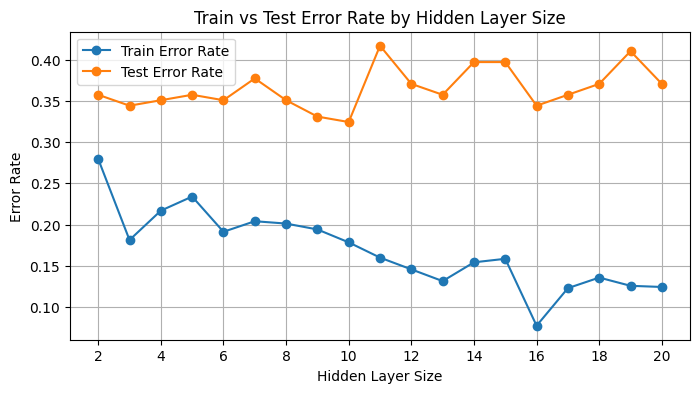

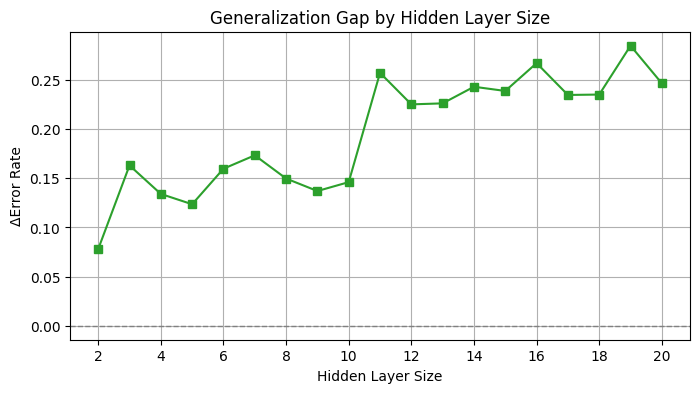

In [70]:
hidden_sizes = range(2, 21)
train_err   = []
test_err    = []
delta_mse   = []

for size in hidden_sizes:
    results = ann_cla(
        X_train_2, y_train_2,
        X_test_2,  y_test_2,
        size=size,
        max_iter=10000,
        trace=False,
        n_try=5
    )
    train_err.append(results['best_train_erate'])
    test_err .append(results['best_test_erate'])
    delta_mse.append(results['best_test_erate'] - results['best_train_erate'])

# — Plot train vs test error rate —
plt.figure(figsize=(8, 4))
plt.plot(hidden_sizes, train_err, label='Train Error Rate', marker='o')
plt.plot(hidden_sizes, test_err,  label='Test Error Rate',  marker='o')
plt.xlabel('Hidden Layer Size')
plt.ylabel('Error Rate')
plt.title('Train vs Test Error Rate by Hidden Layer Size')
plt.xticks(np.arange(2, 21, 2))
plt.legend()
plt.grid(True)
plt.show()

# — Plot generalization gap (ΔMSE) —
plt.figure(figsize=(8, 4))
plt.plot(hidden_sizes, delta_mse, marker='s', color='C2')
plt.xlabel('Hidden Layer Size')
plt.ylabel('ΔError Rate')
plt.title('Generalization Gap by Hidden Layer Size')
plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.xticks(np.arange(2, 21, 2))
plt.grid(True)
plt.show()


In [71]:
model_ann_cla = ann_cla(X_train_2, y_train_2, X_test_2, y_test_2,
                10, max_iter=1000, trace=False, n_try=5)

In [72]:
model_ann_cla


{'best_train_erate': 0.1783166904422254,
 'best_test_erate': 0.32450331125827814,
 'best_train_model': MLPClassifier(hidden_layer_sizes=(10,), max_iter=1000, random_state=4),
 'best_test_model': MLPClassifier(hidden_layer_sizes=(10,), max_iter=1000, random_state=3)}

In [73]:
ann_model = model_ann_cla['best_test_model']

In [74]:
# select the max number of classes of each row
y_pred_proba = ann_model.predict_proba(X_test_2)
# select the max number of classes of each row and return the index of the column
y_pred = np.argmax(y_pred_proba, axis=1)
# convert the index to the class
y_pred
y_pred_series = pd.Series(y_pred, index=y_test_2.index, name="predicted")

# 2. Build a DataFrame with both actual and predicted
df_cm = pd.DataFrame({
    "actual":    y_test_2,
    "predicted": y_pred_series
})

# 3. Crosstab to get the counts
confusion = pd.crosstab(
    df_cm["actual"],
    df_cm["predicted"],
    rownames=["Actual"],
    colnames=["Predicted"]
)

print(confusion)

Predicted   0   1
Actual           
0          27  27
1          22  75


In [75]:
model_performance_classification(ann_model, X_test_2, y_test_2)

{'accuracy': 0.6754966887417219,
 'precision': 0.7352941176470589,
 'recall': 0.7731958762886598,
 'f1': 0.7537688442211056,
 'error_rate': 0.32450331125827814,
 'specificity': 0.5,
 'roc_auc': 0.5935471554028255}

## Model 2: Classification Tree & Random Forest


In [76]:
# Function to evaluate classification performance
def model_performance_classification(model, X, y):
    """Evaluate classification model performance with comprehensive metrics"""
    from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                               f1_score, roc_curve, auc, confusion_matrix)

    # Generate predictions
    y_pred = model.predict(X)

    # Calculate confusion matrix values
    tn, fp, fn, tp = confusion_matrix(y, y_pred).ravel()

    # Get probability predictions if available
    if hasattr(model, "predict_proba"):
        y_prob = model.predict_proba(X)[:, 1]
        fpr, tpr, _ = roc_curve(y == list(set(y))[1], y_prob)
        roc_auc = auc(fpr, tpr)
    else:
        roc_auc = None

    # Return all metrics
    return {
        'accuracy': accuracy_score(y, y_pred),
        'precision': precision_score(y, y_pred),
        'recall': recall_score(y, y_pred),
        'f1': f1_score(y, y_pred),
        'error_rate': 1 - accuracy_score(y, y_pred),
        'specificity': tn / (tn + fp),
        'roc_auc': roc_auc
    }

In [77]:
# Build Classification tree
dt_model_2 = DecisionTreeClassifier(
    max_depth=5,
    min_samples_split=30,
    min_samples_leaf=15,
    criterion='gini',
    class_weight='balanced',
    splitter='best',
    max_features='sqrt',
    min_impurity_decrease=0.0001,
    random_state=42
)

dt_model_2.fit(X_train_2, y_train_2)
dt_model_2.fit(X_train_2, y_train_2)



DecisionTreeClassifier(class_weight='balanced', max_depth=5,
                       max_features='sqrt', min_impurity_decrease=0.0001,
                       min_samples_leaf=15, min_samples_split=30,
                       random_state=42)

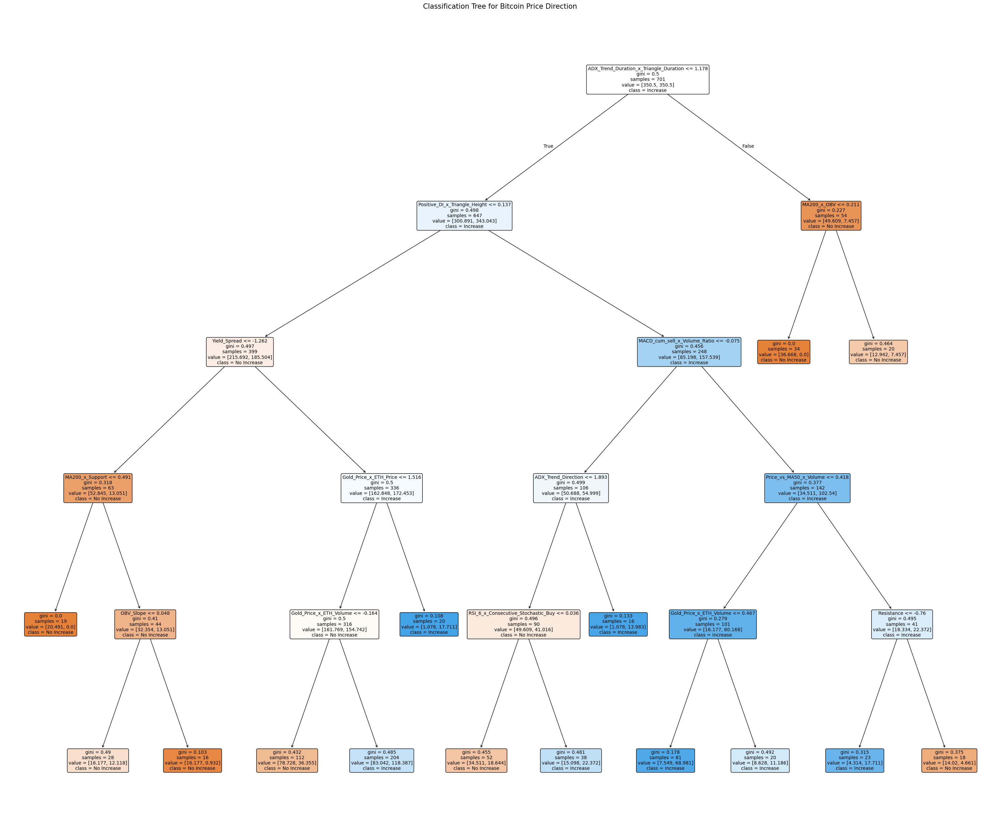

Basic Decision Tree performance (Training): {'accuracy': 0.717546362339515, 'precision': 0.7213930348258707, 'recall': 0.7712765957446809, 'f1': 0.7455012853470437, 'error_rate': 0.28245363766048504, 'specificity': 0.6553846153846153, 'roc_auc': 0.786665302782324}
Basic Decision Tree performance (Validation): {'accuracy': 0.48, 'precision': 0.4117647058823529, 'recall': 0.42424242424242425, 'f1': 0.417910447761194, 'error_rate': 0.52, 'specificity': 0.5238095238095238, 'roc_auc': 0.43686868686868685}
Basic Decision Tree performance (Testing): {'accuracy': 0.4768211920529801, 'precision': 0.5978260869565217, 'recall': 0.5670103092783505, 'f1': 0.582010582010582, 'error_rate': 0.5231788079470199, 'specificity': 0.3148148148148148, 'roc_auc': 0.3848797250859106}


In [78]:
# Visualize decision tree
plt.figure(figsize=(30, 25))
plot_tree(dt_model_2,
          feature_names=X_train_2.columns,
          filled=True,
          rounded=True,
          fontsize=10,
          class_names=['No Increase', 'Increase'],
          proportion=False)

plt.title('Classification Tree for Bitcoin Price Direction', fontsize=15)
plt.tight_layout()
plt.show()

# Evaluate on training data
dt_train_performance = model_performance_classification(dt_model_2, X_train_2, y_train_2)
print("Basic Decision Tree performance (Training):", dt_train_performance)

# Evaluate on validation
dt_val_performance = model_performance_classification(dt_model_2, X_val_2, y_val_2)
print("Basic Decision Tree performance (Validation):", dt_val_performance)

# Evaluate on testing data
dt_test_performance = model_performance_classification(dt_model_2, X_test_2, y_test_2)
print("Basic Decision Tree performance (Testing):", dt_test_performance)

In [79]:
# Build random forest classifier
classifier = RandomForestClassifier(
    n_estimators=100,
    max_depth=8,
    min_samples_split=20,
    min_samples_leaf=10,
    max_features='sqrt',
    bootstrap=True,
    criterion='gini',
    max_leaf_nodes=None,
    min_impurity_decrease=0.0001,
    class_weight='balanced',
    max_samples=0.8,
    random_state=42,
    n_jobs=-1
)


with tqdm(total=1, desc="Fitting classifier") as pbar:
    classifier.fit(X_train_2, y_train_2)
    pbar.update(1)

# Evaluate on training set
train_performance = model_performance_classification(classifier, X_train_2, y_train_2)
print("Training performance:", train_performance)

# Evaluate on validation set
val_performance = model_performance_classification(classifier, X_val_2, y_val_2)
print("Validation performance:", val_performance)

# Evaluate on test set
test_performance = model_performance_classification(classifier, X_test_2, y_test_2)
print("Testing performance:", test_performance)

Fitting classifier:   0%|          | 0/1 [00:00<?, ?it/s]

Training performance: {'accuracy': 0.9243937232524965, 'precision': 0.9306666666666666, 'recall': 0.9281914893617021, 'f1': 0.929427430093209, 'error_rate': 0.07560627674750353, 'specificity': 0.92, 'roc_auc': 0.977454991816694}
Validation performance: {'accuracy': 0.5133333333333333, 'precision': 0.4507042253521127, 'recall': 0.48484848484848486, 'f1': 0.46715328467153283, 'error_rate': 0.4866666666666667, 'specificity': 0.5357142857142857, 'roc_auc': 0.47655122655122656}
Testing performance: {'accuracy': 0.4900662251655629, 'precision': 0.6388888888888888, 'recall': 0.4742268041237113, 'f1': 0.5443786982248521, 'error_rate': 0.509933774834437, 'specificity': 0.5185185185185185, 'roc_auc': 0.5089728904161893}



Calculating feature importance...


Permutation importance:   0%|          | 0/1 [00:00<?, ?it/s]

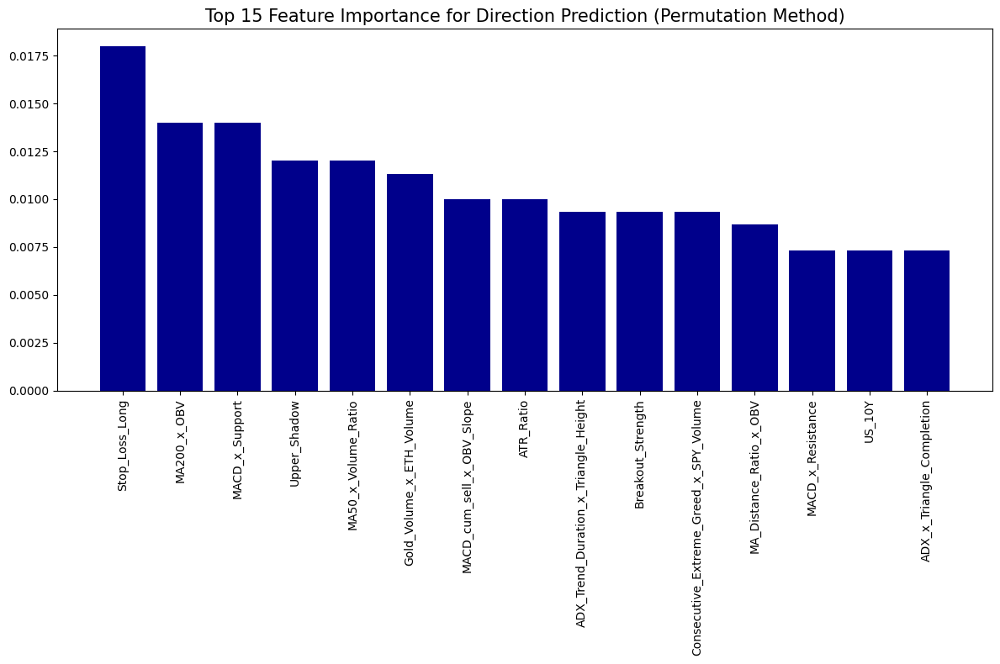

Selected 93 out of 269 features
Selected features: ['Stop_Loss_Long', 'MA200_x_OBV', 'MACD_x_Support', 'Upper_Shadow', 'MA50_x_Volume_Ratio', 'Gold_Volume_x_ETH_Volume', 'MACD_cum_sell_x_OBV_Slope', 'ATR_Ratio', 'ADX_Trend_Duration_x_Triangle_Height', 'Breakout_Strength', 'Consecutive_Extreme_Greed_x_SPY_Volume', 'MA_Distance_Ratio_x_OBV', 'MACD_x_Resistance', 'US_10Y', 'ADX_x_Triangle_Completion', 'Price_vs_MA200_x_Support', 'MACD_cum_buy_x_OBV_Slope', 'Gold_Price_x_ETH_Price', 'RSI_12_x_Consecutive_Stochastic_Sell', 'MACD_cum_sell_x_Resistance', 'RSI_12_x_Consecutive_Stochastic_Buy', 'RSI_6_x_Stochastic_perK', 'MACD_x_Volume_Ratio', 'ADX_Trend_Direction', 'MACD_above_signal_x_OBV_Slope', 'Positive_DI_x_Triangle_Duration', 'MACD_x_OBV_Slope', 'ADX_Strength_x_Triangle_Height', 'Stochastic_perD', 'MACD_Signal', 'RSI_12', 'Triangle_Height', 'MACD_below_signal_x_Volume_Ratio', 'MACD', 'Stop_Loss_Short', 'Positive_DI_x_Triangle_Height', 'MACD_cum_sell_x_Volume_Ratio', 'RSI_Divergence_x_Sto

In [80]:
# Calculate permutation importance on validation set with progress bar
print("\nCalculating feature importance...")
with tqdm(total=1, desc="Permutation importance") as pbar:
    perm_result = permutation_importance(
        classifier, X_val_2, y_val_2,
        n_repeats=10,
        random_state=42,
        n_jobs=-1
    )
    pbar.update(1)

# Get importance scores and sort them
importances = perm_result.importances_mean
indices = np.argsort(importances)[::-1]  # Sort in descending order

# Plot only top 15 feature importances
plt.figure(figsize=(12, 8))
plt.title('Top 15 Feature Importance for Direction Prediction (Permutation Method)', fontsize=15)

# Select top 15 features
top_n = 15
top_indices = indices[:top_n]
top_importances = importances[top_indices]
feature_names = [X_train_2.columns[i] for i in top_indices]

# Create the bar plot for top features
plt.bar(range(len(top_indices)), top_importances, color='darkblue')
plt.xticks(range(len(top_indices)), feature_names, rotation=90)
plt.tight_layout()
plt.show()

# Select features with positive importance
threshold = 0  # Only include features that improve predictions
selected_features = [X_train_2.columns[i] for i in indices if importances[i] > threshold]
print(f"Selected {len(selected_features)} out of {X_train_2.shape[1]} features")
print("Selected features:", selected_features)

# Create datasets with only selected features
X_train_2_selected = X_train_2[selected_features]
X_val_2_selected = X_val_2[selected_features]
X_test_2_selected = X_test_2[selected_features]


Starting grid search with 324 parameter combinations
Total model fits to perform: 1620

Starting hyperparameter search...


Grid search progress:   0%|          | 0/1 [00:00<?, ?it/s]

Grid search completed!
Best parameters: {'class_weight': None, 'max_depth': 20, 'max_features': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Tuned model validation performance: {'accuracy': 0.47333333333333333, 'precision': 0.42696629213483145, 'recall': 0.5757575757575758, 'f1': 0.49032258064516127, 'error_rate': 0.5266666666666666, 'specificity': 0.39285714285714285, 'roc_auc': 0.4643759018759019}


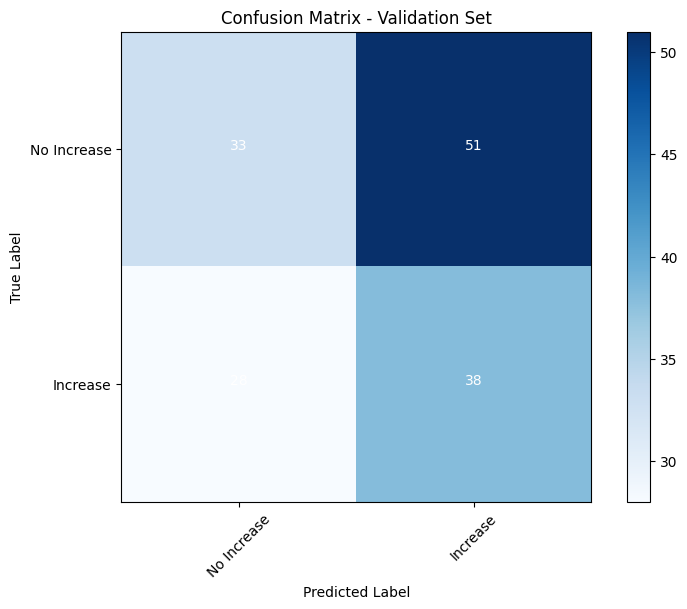


Training final model on combined training and validation data...


Training final model:   0%|          | 0/1 [00:00<?, ?it/s]

In [81]:
# Hyperparameter tuning
rf_tuned = RandomForestClassifier(random_state=42)

# Grid of parameters
parameters = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'max_features': ['sqrt', 'log2', 0.7],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': ['balanced', 'balanced_subsample', None]  # Important for imbalanced classes
}

# Use time series cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# Calculate total parameter combinations
total_combinations = (
    len(parameters['n_estimators']) *
    len(parameters['max_depth']) *
    len(parameters['max_features']) *
    len(parameters['min_samples_split']) *
    len(parameters['min_samples_leaf']) *
    len(parameters['class_weight'])
)
total_fits = total_combinations * tscv.n_splits

# Run the grid search with progress tracking
print(f"\nStarting grid search with {total_combinations} parameter combinations")
print(f"Total model fits to perform: {total_fits}\n")

# Create a wrapper to track progress
class ProgressGridSearchCV(GridSearchCV):
    def fit(self, X, y):
        with tqdm(total=1, desc="Grid search progress") as pbar:
            result = super().fit(X, y)
            pbar.update(1)
        return result

grid_obj = ProgressGridSearchCV(
    rf_tuned,
    parameters,
    scoring='f1',  # F1 score is good for imbalanced classes
    cv=tscv,
    n_jobs=-1,     # Use all CPU cores
    verbose=0      # Disable default verbose since we're using tqdm
)

print("Starting hyperparameter search...")
grid_obj.fit(X_train_2_selected, y_train_2)
print("Grid search completed!")

# Get the best model
rf_tuned_classifier = grid_obj.best_estimator_
print("Best parameters:", grid_obj.best_params_)
tuned_val_performance = model_performance_classification(rf_tuned_classifier, X_val_2_selected, y_val_2)
print("Tuned model validation performance:", tuned_val_performance)

# Show confusion matrix
y_val_pred = rf_tuned_classifier.predict(X_val_2_selected)
cm = confusion_matrix(y_val_2, y_val_pred)
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix - Validation Set')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['No Increase', 'Increase'], rotation=45)
plt.yticks(tick_marks, ['No Increase', 'Increase'])
plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

# Add text annotations
thresh = cm.max() / 2
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
plt.show()

# Train final model on combined training and validation data
print("\nTraining final model on combined training and validation data...")
X_train_val_2 = pd.concat([X_train_2_selected, X_val_2_selected])
y_train_val_2 = pd.concat([y_train_2, y_val_2])

final_rfmodel_2 = RandomForestClassifier(**grid_obj.best_params_, random_state=1)
with tqdm(total=1, desc="Training final model") as pbar:
    final_rfmodel_2.fit(X_train_val_2, y_train_val_2)
    pbar.update(1)


Final test performance: {'accuracy': 0.37748344370860926, 'precision': 1.0, 'recall': 0.030927835051546393, 'f1': 0.06, 'error_rate': 0.6225165562913908, 'specificity': 1.0, 'roc_auc': 0.42630775105001906}


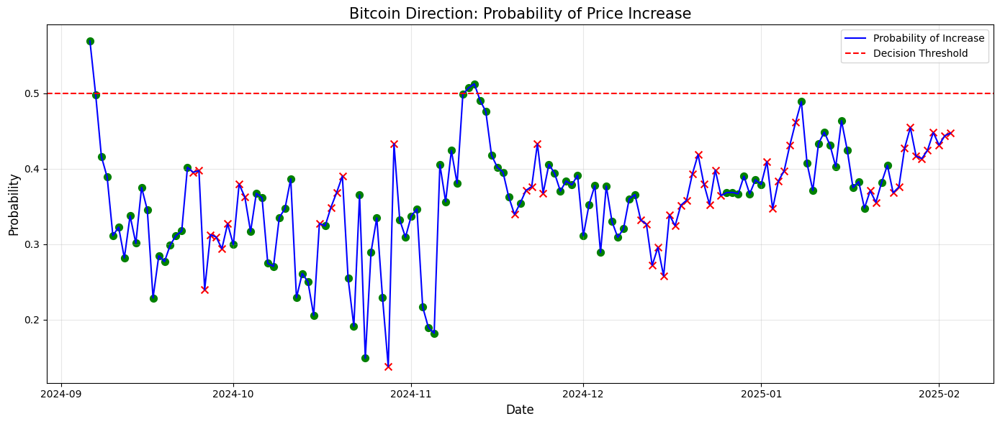

In [82]:
# Final evaluation on test set
final_test_performance = model_performance_classification(final_rfmodel_2, X_test_2_selected, y_test_2)
print("\nFinal test performance:", final_test_performance)

# Plot prediction probabilities on test set
y_test_proba = final_rfmodel_2.predict_proba(X_test_2_selected)[:, 1]  # Probability of class 1 (increase)
plt.figure(figsize=(14, 6))
plt.title('Bitcoin Direction: Probability of Price Increase', fontsize=15)
plt.plot(y_test_2.index, y_test_proba, label='Probability of Increase', color='blue')
plt.axhline(y=0.5, color='red', linestyle='--', label='Decision Threshold')
# Add actual outcomes as points
for idx, actual in zip(y_test_2.index, y_test_2):
    marker = 'o' if actual == 1 else 'x'
    color = 'green' if actual == 1 else 'red'
    plt.scatter(idx, y_test_proba[y_test_2.index.get_loc(idx)], marker=marker, color=color, s=50)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Probability', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [83]:
# Function to predict with confidence using prediction probabilities
def predict_with_confidence_classification(model, X_data, n_bootstrap=100):
    """Generate predictions with confidence intervals for classification probabilities"""
    all_proba = []

    # Get all individual tree predictions (probabilities) with progress bar
    for tree in tqdm(model.estimators_, desc="Building confidence intervals"):
        # For each tree, get the probability of class 1 (price increase)
        tree_proba = tree.predict_proba(X_data)[:, 1]
        all_proba.append(tree_proba)

    # Convert to numpy array
    all_proba = np.array(all_proba)

    # Calculate mean probability (overall prediction)
    mean_proba = np.mean(all_proba, axis=0)

    # Calculate confidence intervals
    lower_bound = np.percentile(all_proba, 2.5, axis=0)
    upper_bound = np.percentile(all_proba, 97.5, axis=0)

    # Predict labels based on mean probability
    pred_labels = (mean_proba >= 0.5).astype(int)

    return mean_proba, lower_bound, upper_bound, pred_labels

# Generate predictions with confidence intervals (already has progress bar)
print("\nGenerating predictions with confidence intervals...")
mean_probs, lower_bounds, upper_bounds, pred_labels = predict_with_confidence_classification(
    final_rfmodel_2, X_test_2_selected
)

# Display prediction for the first test sample
first_idx = 0
direction = "UP" if pred_labels[first_idx] == 1 else "DOWN"
confidence = mean_probs[first_idx] if pred_labels[first_idx] == 1 else 1 - mean_probs[first_idx]
margin = (upper_bounds[first_idx] - lower_bounds[first_idx]) / 2

print(f"\nPredicted Bitcoin direction: {direction}")
print(f"Confidence: {confidence*100:.2f}% ± {margin*100:.2f}% with 95% confidence interval")
print(f"Probability range: [{lower_bounds[first_idx]*100:.2f}%, {upper_bounds[first_idx]*100:.2f}%]")


Generating predictions with confidence intervals...


Building confidence intervals:   0%|          | 0/200 [00:00<?, ?it/s]


Predicted Bitcoin direction: UP
Confidence: 56.91% ± 50.00% with 95% confidence interval
Probability range: [0.00%, 100.00%]


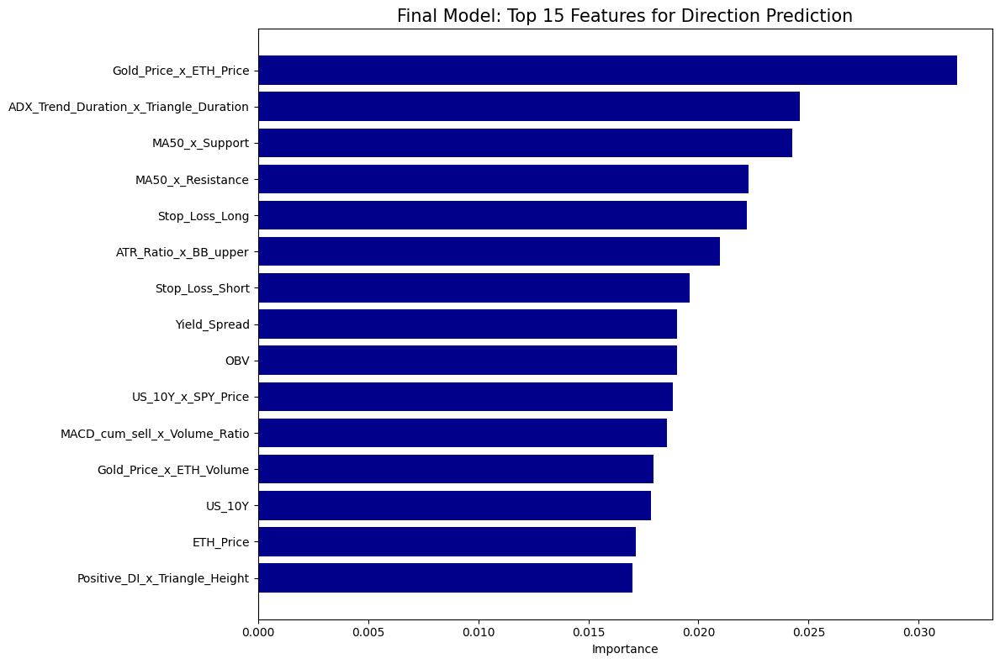


Top 15 most important features for predicting price direction:
                                   Feature  Importance
17                  Gold_Price_x_ETH_Price      0.0318
82  ADX_Trend_Duration_x_Triangle_Duration      0.0246
54                          MA50_x_Support      0.0243
47                       MA50_x_Resistance      0.0223
0                           Stop_Loss_Long      0.0222
67                    ATR_Ratio_x_BB_upper      0.0210
34                         Stop_Loss_Short      0.0196
56                            Yield_Spread      0.0190
80                                     OBV      0.0190
51                      US_10Y_x_SPY_Price      0.0188
36            MACD_cum_sell_x_Volume_Ratio      0.0186
92                 Gold_Price_x_ETH_Volume      0.0179
13                                  US_10Y      0.0178
85                               ETH_Price      0.0172
35           Positive_DI_x_Triangle_Height      0.0170


In [84]:
# Feature importance for final model
final_importances = pd.DataFrame({
    'Feature': selected_features,
    'Importance': final_rfmodel_2.feature_importances_
})
final_importances = final_importances.sort_values('Importance', ascending=False)

# Get only top 15 features
top_15_features = final_importances.head(15)

plt.figure(figsize=(12, 8))
plt.title('Final Model: Top 15 Features for Direction Prediction', fontsize=15)
plt.barh(range(len(top_15_features)), top_15_features['Importance'], color='darkblue')
plt.yticks(range(len(top_15_features)), top_15_features['Feature'])
plt.xlabel('Importance')
plt.gca().invert_yaxis()  # To have the highest importance at the top
plt.tight_layout()
plt.show()

print("\nTop 15 most important features for predicting price direction:")
print(final_importances.head(15))

##Model 3: Logistic Regression

Process time around 80 mins

In [85]:
# Stepwise regression function
def stepwise_logistic_regression(X, y, initial_features=None, p_value_threshold=0.05,
                               direction='forward', max_iterations=50, max_features=15):

    all_features = X.columns.tolist()

    # Start with empty list for forward selection
    current_features = [] if initial_features is None else [f for f in initial_features if f in all_features]

    # Add constant for statsmodels
    X_with_const = sm.add_constant(X)

    # Initialize variables
    best_features = current_features.copy()
    iterations_log = []
    iteration = 0
    improved = True
    best_aic = float('inf')
    best_model = None

    print(f"Starting with {len(current_features)} features")
    if current_features:
        print(f"Initial features: {current_features}")

    # Start stepwise selection
    while improved and iteration < max_iterations and len(current_features) < max_features:
        improved = False
        iteration += 1
        print(f"\nIteration {iteration}:")

        # Define candidate features for forward selection
        forward_candidates = [f for f in all_features if f not in current_features]

        # Try adding one feature (forward selection)
        best_forward_feature = None
        best_forward_aic = float('inf')

        if direction in ['forward', 'both']:
            for feature in forward_candidates:
                candidate_features = current_features + [feature]
                try:
                    # Prepare features including constant
                    X_subset = X_with_const[['const'] + candidate_features]

                    # Fit model and get AIC
                    try:
                        model = sm.Logit(y, X_subset).fit(disp=0, method='lbfgs', maxiter=200)
                    except:
                        model = sm.Logit(y, X_subset).fit(disp=0, method='bfgs', maxiter=200)

                    aic = model.aic

                    # Check if p-value for the newly added feature is significant
                    p_value = model.pvalues.get(feature, 1.0)

                    if p_value <= p_value_threshold and aic < best_forward_aic:
                        best_forward_aic = aic
                        best_forward_feature = feature
                        best_forward_model = model
                        print(f"  Testing adding {feature}: AIC={aic:.2f}, p-value={p_value:.4f}")
                except Exception as e:
                    print(f"  Error testing {feature}: {str(e)[:60]}...")
                    continue

        # Check if we can add the feature
        if best_forward_feature and (best_forward_aic < best_aic):
            # Add the best feature
            print(f"Adding feature: {best_forward_feature}, AIC: {best_forward_aic:.2f}")
            current_features.append(best_forward_feature)
            best_aic = best_forward_aic
            best_model = best_forward_model
            improved = True
            iterations_log.append({
                'iteration': iteration,
                'action': 'add',
                'feature': best_forward_feature,
                'aic': best_forward_aic,
                'features': current_features.copy()
            })

        # If direction includes backward, check for insignificant features to remove
        if direction in ['backward', 'both'] and len(current_features) > 1 and best_model is not None:
            # Get p-values for all features
            p_values = {col: best_model.pvalues.get(col, 1.0) for col in current_features}

            # Find the most insignificant feature (if any)
            insignificant_features = [f for f in current_features if p_values.get(f, 0) > p_value_threshold]

            if insignificant_features:
                # Sort by p-value (most insignificant first)
                insignificant_features.sort(key=lambda f: p_values.get(f, 0), reverse=True)

                # Remove the most insignificant feature and refit
                feature_to_remove = insignificant_features[0]
                candidate_features = [f for f in current_features if f != feature_to_remove]

                try:
                    # Prepare features including constant
                    X_subset = X_with_const[['const'] + candidate_features]

                    # Fit model and get AIC
                    model = sm.Logit(y, X_subset).fit(disp=0, method='lbfgs', maxiter=200)
                    aic = model.aic

                    print(f"Testing removal of {feature_to_remove}: AIC={aic:.2f}, p-value={p_values.get(feature_to_remove, 1):.4f}")

                    # If removing improves AIC, remove it
                    if aic < best_aic:
                        print(f"Removing feature: {feature_to_remove}, AIC: {aic:.2f}")
                        current_features = candidate_features
                        best_aic = aic
                        best_model = model
                        improved = True
                        iterations_log.append({
                            'iteration': iteration,
                            'action': 'remove',
                            'feature': feature_to_remove,
                            'aic': aic,
                            'features': current_features.copy()
                        })
                except Exception as e:
                    print(f"Error removing {feature_to_remove}: {str(e)[:60]}...")

        # Update best features if improved
        if improved:
            best_features = current_features.copy()

        print(f"Current features ({len(current_features)}): {current_features}")
        print(f"Current AIC: {best_aic:.2f}")

    # Final model with best features
    if best_features:
        try:
            X_final = X_with_const[['const'] + best_features]
            final_model = sm.Logit(y, X_final).fit(disp=0, method='lbfgs', maxiter=200)
            return best_features, final_model, iterations_log
        except Exception as e:
            print(f"Error fitting final model: {str(e)}")
            return best_features, best_model, iterations_log

    return [], None, iterations_log


In [86]:
# Calculate comprehensive metrics
def cal_metrics(y_true, y_pred):
    """Calculate detailed classification metrics"""
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    false_negative_rate = fn / (tp + fn) if (tp + fn) > 0 else 0
    error_rate = (fp + fn) / (tp + tn + fp + fn)

    return {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'Specificity': specificity,
        'F1_Score': f1,
        'False_Negative_Rate': false_negative_rate,
        'Error_Rate': error_rate
    }

Starting with 0 features

Iteration 1:
  Testing adding OBV: AIC=955.07, p-value=0.0001
  Testing adding ADX_Trend_Duration_x_Triangle_Completion: AIC=945.71, p-value=0.0000
Adding feature: ADX_Trend_Duration_x_Triangle_Completion, AIC: 945.71
Current features (1): ['ADX_Trend_Duration_x_Triangle_Completion']
Current AIC: 945.71

Iteration 2:
  Testing adding OBV: AIC=933.97, p-value=0.0003
  Testing adding US_10Y: AIC=933.68, p-value=0.0002
Adding feature: US_10Y, AIC: 933.68
Current features (2): ['ADX_Trend_Duration_x_Triangle_Completion', 'US_10Y']
Current AIC: 933.68

Iteration 3:
  Testing adding OBV: AIC=931.79, p-value=0.0498
  Testing adding Consecutive_RSI_12_Overbought: AIC=930.79, p-value=0.0360
  Testing adding Consecutive_ADX_Sell: AIC=927.14, p-value=0.0039
  Testing adding Positive_DI_x_Triangle_Completion: AIC=926.66, p-value=0.0048
  Testing adding MACD_cum_sell_x_Volume_Ratio: AIC=921.60, p-value=0.0003
Adding feature: MACD_cum_sell_x_Volume_Ratio, AIC: 921.60
Curren

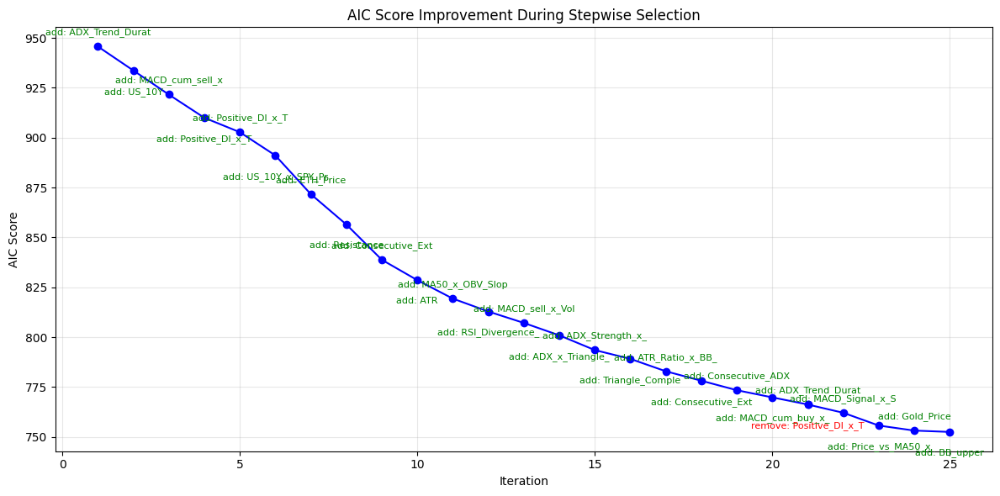

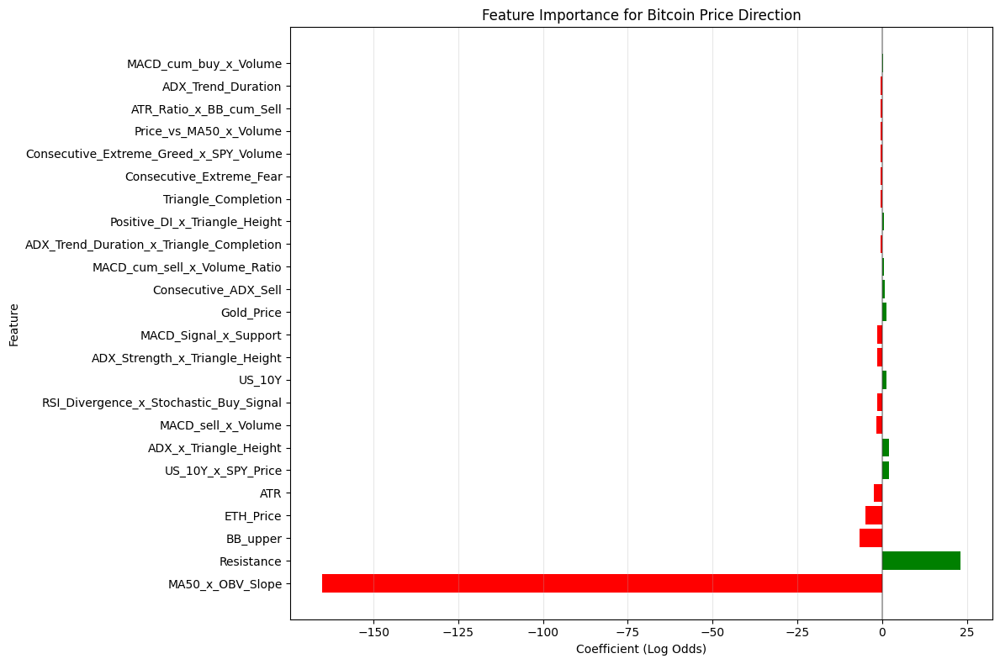


Feature Importance:
                                     Feature  Coefficient       Odds_Ratio  \
0                           MA50_x_OBV_Slope    -165.0921           0.0000   
1                                 Resistance      23.1190 10976385851.2771   
2                                   BB_upper      -6.5856           0.0014   
3                                  ETH_Price      -4.9574           0.0070   
4                                        ATR      -2.4581           0.0856   
5                         US_10Y_x_SPY_Price       2.0306           7.6183   
6                      ADX_x_Triangle_Height       1.9476           7.0118   
7                         MACD_sell_x_Volume      -1.8149           0.1628   
8     RSI_Divergence_x_Stochastic_Buy_Signal      -1.5143           0.2200   
9                                     US_10Y       1.3618           3.9033   
10            ADX_Strength_x_Triangle_Height      -1.3564           0.2576   
11                     MACD_Signal_x_Suppor

In [87]:
import time

# Build stepwise logistic regression
start_time = time.time()

initial_features = []  # Start with empty set

# Run stepwise regression
final_features, final_model, iterations_log = stepwise_logistic_regression(
    X_train_2,
    y_train_2,
    initial_features=initial_features,
    p_value_threshold=0.05,
    direction='both',  # Use both forward and backward steps
    max_iterations=100,
    max_features=300
)

elapsed_time = time.time() - start_time
print(f"\nStepwise regression completed in {elapsed_time:.2f} seconds")
print(f"Selected {len(final_features)} features out of {len(X_train_2.columns)} candidates")
print("Selected features:", final_features)

# Visualize the feature selection process
iterations_df = pd.DataFrame(iterations_log)
if not iterations_df.empty:
    plt.figure(figsize=(12, 6))
    plt.plot(iterations_df['iteration'], iterations_df['aic'], 'o-', color='blue')
    plt.xlabel('Iteration')
    plt.ylabel('AIC Score')
    plt.title('AIC Score Improvement During Stepwise Selection')
    plt.grid(True, alpha=0.3)

    # Annotate add/remove actions
    for i, row in iterations_df.iterrows():
        action_color = 'green' if row['action'] == 'add' else 'red'
        plt.annotate(
            f"{row['action']}: {row['feature'][:15]}",
            (row['iteration'], row['aic']),
            textcoords="offset points",
            xytext=(0, 10 if i % 2 == 0 else -20),
            ha='center',
            color=action_color,
            fontsize=8
        )

    plt.tight_layout()
    plt.show()

# Feature importance from the final model
if final_model is not None:
    # Get model coefficients (excluding constant)
    coefficients = final_model.params.drop('const', errors='ignore')

    # Calculate odds ratios and confidence intervals
    conf_int = final_model.conf_int()
    odds_ratios = np.exp(coefficients)
    odds_ratios_ci = np.exp(conf_int.drop('const', errors='ignore'))

    # Create a DataFrame with the results
    feature_importance = pd.DataFrame({
        'Feature': coefficients.index,
        'Coefficient': coefficients.values,
        'Odds_Ratio': odds_ratios.values,
        'CI_Lower': odds_ratios_ci[0].values,
        'CI_Upper': odds_ratios_ci[1].values,
        'P_Value': final_model.pvalues.drop('const', errors='ignore').values
    })

    # Sort by absolute coefficient value
    feature_importance['Abs_Coefficient'] = feature_importance['Coefficient'].abs()
    feature_importance = feature_importance.sort_values('Abs_Coefficient', ascending=False).reset_index(drop=True)

    # Plot feature importance
    plt.figure(figsize=(12, max(8, len(feature_importance) * 0.3)))

    # Color based on positive/negative impact
    colors = ['green' if c > 0 else 'red' for c in feature_importance['Coefficient']]

    # Create the bar plot
    plt.barh(
        feature_importance['Feature'],
        feature_importance['Coefficient'],
        color=colors
    )

    plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    plt.title('Feature Importance for Bitcoin Price Direction')
    plt.xlabel('Coefficient (Log Odds)')
    plt.ylabel('Feature')
    plt.grid(True, axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Print detailed feature importance table
    print("\nFeature Importance:")
    pd.set_option('display.max_rows', None)
    print(feature_importance[['Feature', 'Coefficient', 'Odds_Ratio', 'P_Value', 'CI_Lower', 'CI_Upper']])

    # Print model summary
    print("\nFinal Model Summary:")
    print(final_model.summary())

In [88]:
# Calculate training set results (X_train_2, y_train_2)
print("\nEvaluating on training set...")

# Add constant for predictions
X_train_selected = sm.add_constant(X_train_2[final_features])

# Get training predictions
train_probs = final_model.predict(X_train_selected)
train_preds = (train_probs > 0.5).astype(int)

# Calculate detailed training metrics
train_metrics = cal_metrics(y_train_2, train_preds)
train_auc = roc_auc_score(y_train_2, train_probs)

print("\nTraining Set Performance:")
print(f"Accuracy: {train_metrics['Accuracy']:.4f}")
print(f"AUC: {train_auc:.4f}")
print(f"Recall (Sensitivity): {train_metrics['Recall']:.4f}")
print(f"Specificity: {train_metrics['Specificity']:.4f}")
print(f"Precision: {train_metrics['Precision']:.4f}")
print(f"F1 Score: {train_metrics['F1_Score']:.4f}")
print(f"False Negative Rate: {train_metrics['False_Negative_Rate']:.4f}")
print(f"Error Rate: {train_metrics['Error_Rate']:.4f}")
print("\nClassification Report:")
print(classification_report(y_train_2, train_preds))

# Create confusion matrix for training set
cm_train = confusion_matrix(y_train_2, train_preds)
print("\nConfusion Matrix (Training Set):")
print(cm_train)


Evaluating on training set...

Training Set Performance:
Accuracy: 0.7532
AUC: 0.8342
Recall (Sensitivity): 0.7926
Specificity: 0.7077
Precision: 0.7583
F1 Score: 0.7750
False Negative Rate: 0.2074
Error Rate: 0.2468

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.71      0.73       325
           1       0.76      0.79      0.78       376

    accuracy                           0.75       701
   macro avg       0.75      0.75      0.75       701
weighted avg       0.75      0.75      0.75       701


Confusion Matrix (Training Set):
[[230  95]
 [ 78 298]]



Evaluating on validation set...

Validation Set Performance:
Accuracy: 0.4200
AUC: 0.6326
Recall (Sensitivity): 0.8788
Specificity: 0.0595
Precision: 0.4234
F1 Score: 0.5714
False Negative Rate: 0.1212
Error Rate: 0.5800

Classification Report:
              precision    recall  f1-score   support

           0       0.38      0.06      0.10        84
           1       0.42      0.88      0.57        66

    accuracy                           0.42       150
   macro avg       0.40      0.47      0.34       150
weighted avg       0.40      0.42      0.31       150



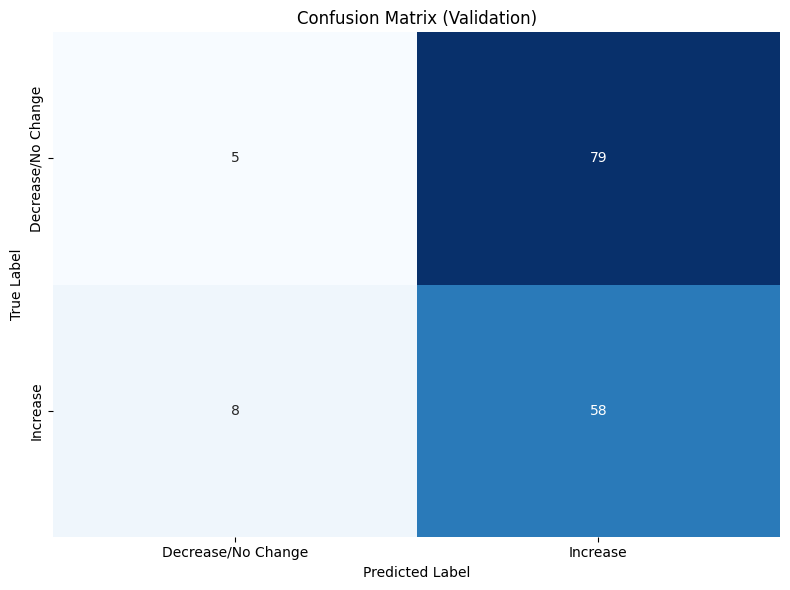


Finding optimal threshold...


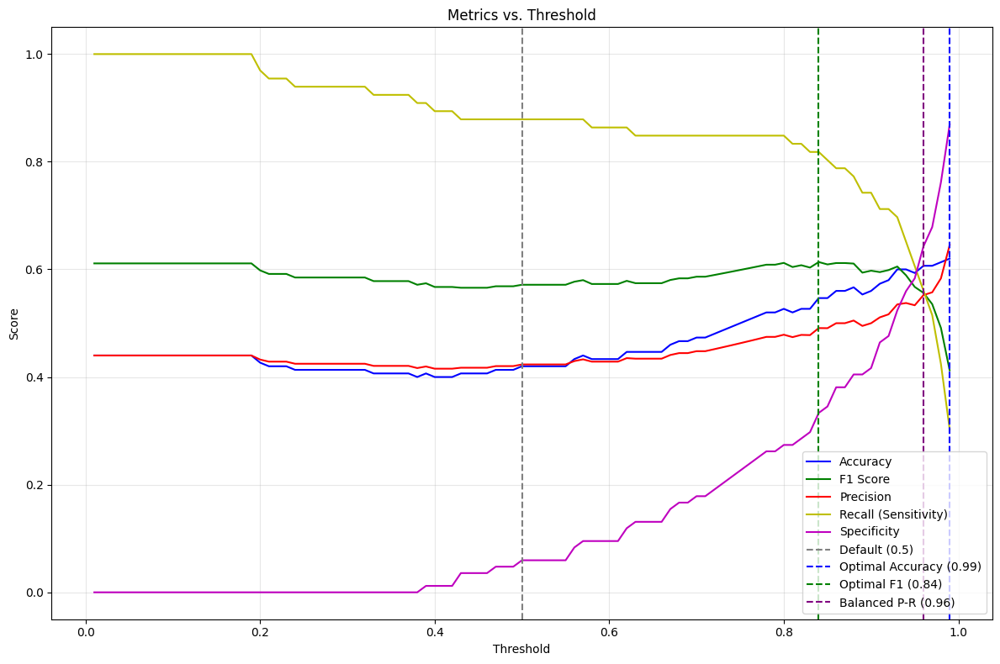

Optimal threshold for accuracy: 0.99
Optimal threshold for F1 score: 0.84
Balanced precision-recall threshold: 0.96
Using threshold: 0.84


In [89]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report

# Evaluate on validation set
print("\nEvaluating on validation set...")

# Add constant for predictions
X_val_selected = sm.add_constant(X_val_2[final_features])

# Get validation predictions
val_probs = final_model.predict(X_val_selected)
val_preds = (val_probs > 0.5).astype(int)


# Calculate detailed validation metrics
val_metrics = cal_metrics(y_val_2, val_preds)
val_auc = roc_auc_score(y_val_2, val_probs)

print("\nValidation Set Performance:")
print(f"Accuracy: {val_metrics['Accuracy']:.4f}")
print(f"AUC: {val_auc:.4f}")
print(f"Recall (Sensitivity): {val_metrics['Recall']:.4f}")
print(f"Specificity: {val_metrics['Specificity']:.4f}")
print(f"Precision: {val_metrics['Precision']:.4f}")
print(f"F1 Score: {val_metrics['F1_Score']:.4f}")
print(f"False Negative Rate: {val_metrics['False_Negative_Rate']:.4f}")
print(f"Error Rate: {val_metrics['Error_Rate']:.4f}")
print("\nClassification Report:")
print(classification_report(y_val_2, val_preds))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_val_2, val_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Validation)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks([0.5, 1.5], ['Decrease/No Change', 'Increase'])
plt.yticks([0.5, 1.5], ['Decrease/No Change', 'Increase'])
plt.tight_layout()
plt.show()

# Find optimal threshold
print("\nFinding optimal threshold...")
# Calculate metrics at different thresholds
thresholds = np.arange(0.01, 1, 0.01)
accuracy_scores = []
f1_scores = []
precision_scores = []
recall_scores = []
specificity_scores = []

for threshold in thresholds:
    y_pred = (val_probs >= threshold).astype(int)
    metrics = cal_metrics(y_val_2, y_pred)
    accuracy_scores.append(metrics['Accuracy'])
    f1_scores.append(metrics['F1_Score'])
    precision_scores.append(metrics['Precision'])
    recall_scores.append(metrics['Recall'])
    specificity_scores.append(metrics['Specificity'])

# Plot metrics vs threshold
plt.figure(figsize=(12, 8))
plt.plot(thresholds, accuracy_scores, 'b-', label='Accuracy')
plt.plot(thresholds, f1_scores, 'g-', label='F1 Score')
plt.plot(thresholds, precision_scores, 'r-', label='Precision')
plt.plot(thresholds, recall_scores, 'y-', label='Recall (Sensitivity)')
plt.plot(thresholds, specificity_scores, 'm-', label='Specificity')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Metrics vs. Threshold')
plt.grid(True, alpha=0.3)
plt.legend()

# Find optimal thresholds for different metrics
opt_acc_threshold = thresholds[np.argmax(accuracy_scores)]
opt_f1_threshold = thresholds[np.argmax(f1_scores)]

# Find threshold where precision and recall are closest (balanced)
pr_diff = np.abs(np.array(precision_scores) - np.array(recall_scores))
opt_pr_threshold = thresholds[np.argmin(pr_diff)]

plt.axvline(x=0.5, color='grey', linestyle='--', label='Default (0.5)')
plt.axvline(x=opt_acc_threshold, color='blue', linestyle='--',
            label=f'Optimal Accuracy ({opt_acc_threshold:.2f})')
plt.axvline(x=opt_f1_threshold, color='green', linestyle='--',
            label=f'Optimal F1 ({opt_f1_threshold:.2f})')
plt.axvline(x=opt_pr_threshold, color='purple', linestyle='--',
            label=f'Balanced P-R ({opt_pr_threshold:.2f})')
plt.legend()
plt.tight_layout()
plt.show()

print(f"Optimal threshold for accuracy: {opt_acc_threshold:.2f}")
print(f"Optimal threshold for F1 score: {opt_f1_threshold:.2f}")
print(f"Balanced precision-recall threshold: {opt_pr_threshold:.2f}")

# Choose the threshold to use (you might prefer F1 for imbalanced data)
chosen_threshold = opt_f1_threshold
print(f"Using threshold: {chosen_threshold:.2f}")

In [90]:
# Retrain on combined train+validation data with selected features
print("\nRetraining on combined training and validation data...")
X_train_val = pd.concat([X_train_2[final_features], X_val_2[final_features]])
y_train_val = pd.concat([y_train_2, y_val_2])

# Add constant for statsmodels
X_train_val_sm = sm.add_constant(X_train_val)

# Fit final statsmodels model
try:
    final_combined_model = sm.Logit(y_train_val, X_train_val_sm).fit(
        disp=0,
        method='lbfgs',
        maxiter=200
    )
    print("\nFinal Combined Model Summary:")
    print(final_combined_model.summary())
except Exception as e:
    print(f"Error fitting combined model: {str(e)}")
    print("Using original model instead")
    final_combined_model = final_model


Retraining on combined training and validation data...

Final Combined Model Summary:
                           Logit Regression Results                           
Dep. Variable:            Positive_7D   No. Observations:                  851
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                           24
Date:                Thu, 01 May 2025   Pseudo R-squ.:                  0.2038
Time:                        09:44:25   Log-Likelihood:                -469.16
converged:                      False   LL-Null:                       -589.23
Covariance Type:            nonrobust   LLR p-value:                 1.475e-37
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -0.0524      0.193 

In [ ]:
# First, create a dataframe with all necessary features
X_test_selected_lr = X_test_2[final_features].copy()

# Then add the constant term
X_test_selected_lr = sm.add_constant(X_test_selected_lr)

# Now verify if all columns in model_columns exist in your dataframe
model_columns = final_combined_model.params.index
missing_cols = [col for col in model_columns if col not in X_test_selected_lr.columns]

if missing_cols:
    # print(f"Missing columns: {missing_cols}")
    # Add missing columns with zeros
    for col in missing_cols:
        X_test_selected_lr[col] = 0

# Now ensure columns are in the exact order needed
X_test_selected_lr = X_test_selected_lr[model_columns]

# Verify alignment
print(f"Test data columns: {X_test_selected_lr.columns.tolist()}")
print(f"Model params: {model_columns.tolist()}")
print(f"Test data shape: {X_test_selected_lr.shape}")
print(f"Model params shape: {final_combined_model.params.shape}")
print(f"Columns match: {list(X_test_selected_lr.columns) == list(model_columns)}")


Evaluating on test set...

Test Set Performance:
Accuracy: 0.5099
AUC: 0.4788
Recall (Sensitivity): 0.6186
Specificity: 0.3148
Precision: 0.6186
F1 Score: 0.6186
False Negative Rate: 0.3814
Error Rate: 0.4901

Classification Report:


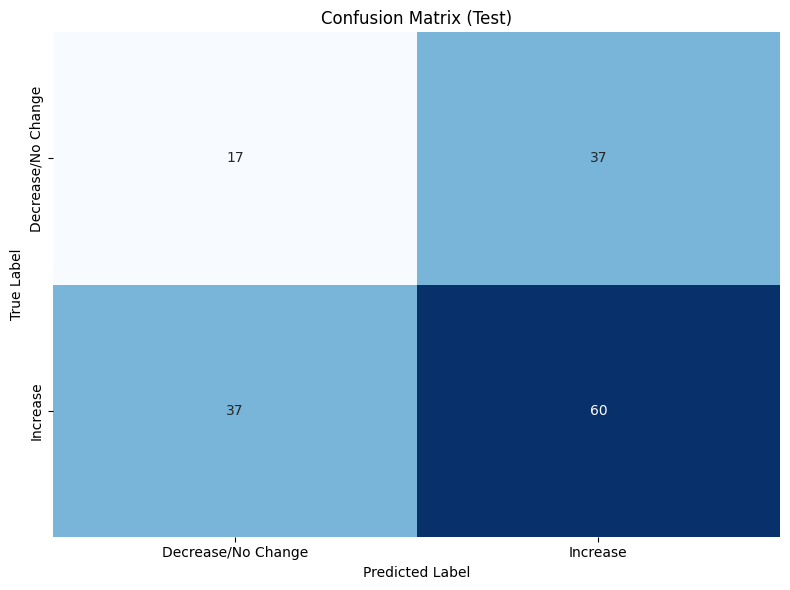

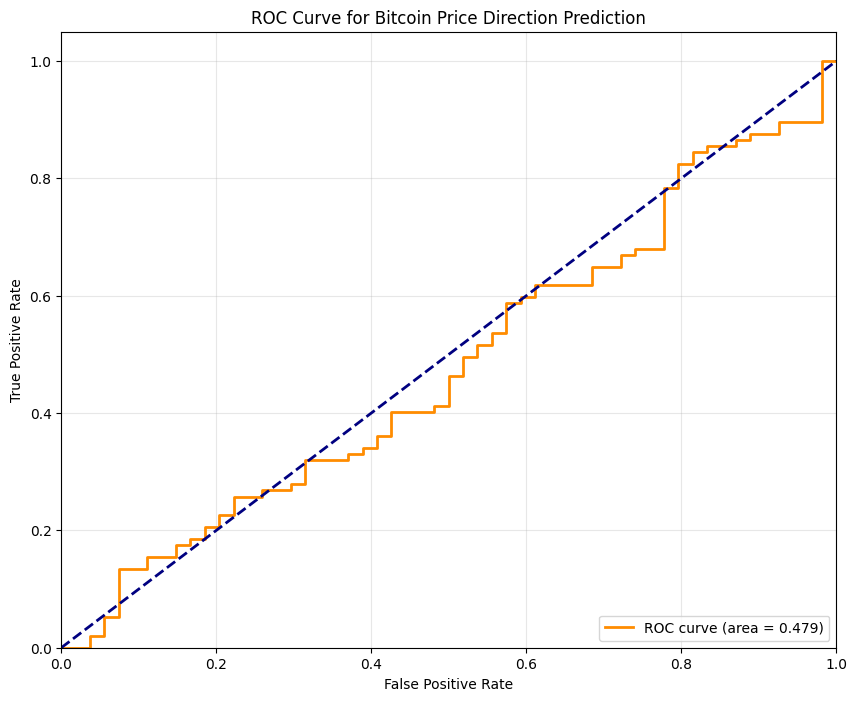

In [92]:
# Evaluate on test set
print("\nEvaluating on test set...")

# Get test predictions
test_probs = final_combined_model.predict(X_test_selected_lr)
test_preds = (test_probs >= chosen_threshold).astype(int)

# Calculate detailed test metrics
test_metrics = cal_metrics(y_test_2, test_preds)
test_auc = roc_auc_score(y_test_2, test_probs)

print("\nTest Set Performance:")
print(f"Accuracy: {test_metrics['Accuracy']:.4f}")
print(f"AUC: {test_auc:.4f}")
print(f"Recall (Sensitivity): {test_metrics['Recall']:.4f}")
print(f"Specificity: {test_metrics['Specificity']:.4f}")
print(f"Precision: {test_metrics['Precision']:.4f}")
print(f"F1 Score: {test_metrics['F1_Score']:.4f}")
print(f"False Negative Rate: {test_metrics['False_Negative_Rate']:.4f}")
print(f"Error Rate: {test_metrics['Error_Rate']:.4f}")
print("\nClassification Report:")
classification_report(y_test_2, test_preds)

# Plot confusion matrix for test set
plt.figure(figsize=(8, 6))
cm_test = confusion_matrix(y_test_2, test_preds)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix (Test)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks([0.5, 1.5], ['Decrease/No Change', 'Increase'])
plt.yticks([0.5, 1.5], ['Decrease/No Change', 'Increase'])
plt.tight_layout()
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test_2, test_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Bitcoin Price Direction Prediction')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

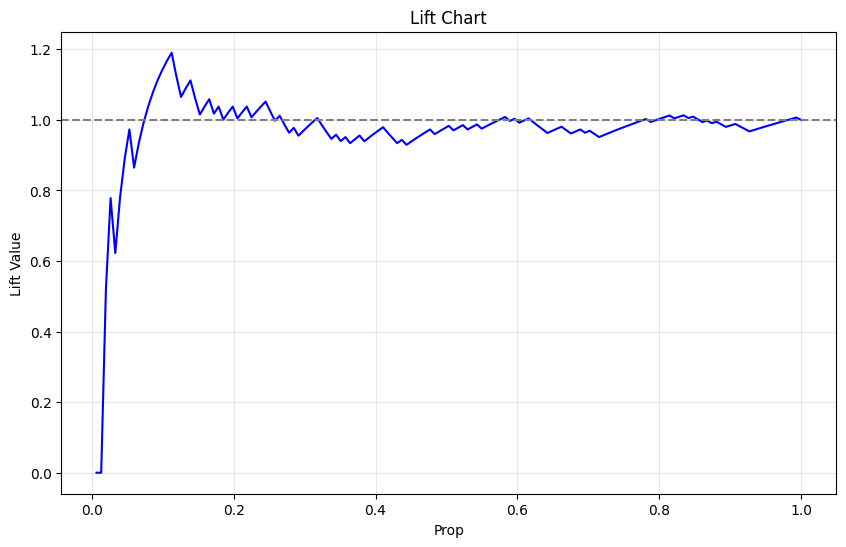

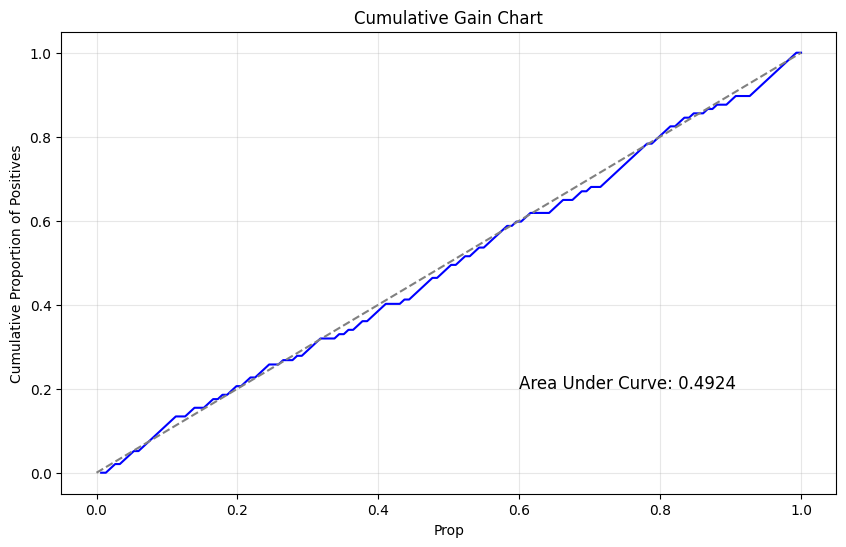

In [93]:
# Lift Chart
def plot_lift_chart(y_true, y_prob, title="Lift Chart", color='blue'):
    # Sort by probability
    df = pd.DataFrame({'y_true': y_true, 'y_prob': y_prob})
    df = df.sort_values(by='y_prob', ascending=False)

    # Calculate lift
    n = len(df)
    n_pos = sum(df['y_true'])
    pos_prop = n_pos / n

    # Calculate cumulative values
    num_records = np.arange(1, n+1)
    cum_pos = df['y_true'].cumsum()
    lift_values = (cum_pos / num_records) / pos_prop

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(np.arange(1, n+1)/n, lift_values, color=color)
    plt.axhline(y=1, color='gray', linestyle='--')
    plt.title(title)
    plt.xlabel('Prop')
    plt.ylabel('Lift Value')
    plt.grid(True, alpha=0.3)
    plt.show()

    return lift_values

# Gain Chart
def plot_gain_chart(y_true, y_prob, title="Cumulative Gain Chart", color='blue'):
    # Sort by probability
    df = pd.DataFrame({'y_true': y_true, 'y_prob': y_prob})
    df = df.sort_values(by='y_prob', ascending=False)

    # Calculate cumulative gain
    n = len(df)
    n_pos = sum(df['y_true'])
    cum_pos = df['y_true'].cumsum()
    cum_pos_prop = cum_pos / n_pos

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(np.arange(1, n+1)/n, cum_pos_prop, color=color)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.title(title)
    plt.xlabel('Prop')
    plt.ylabel('Cumulative Proportion of Positives')
    plt.grid(True, alpha=0.3)

    # Calculate area under gain curve
    auc_value = np.trapz(cum_pos_prop, np.arange(1, n+1)/n)
    plt.text(0.6, 0.2, f'Area Under Curve: {auc_value:.4f}', fontsize=12)
    plt.show()

    return auc_value

# Generate and plot lift and gain charts
lift_values = plot_lift_chart(y_test_2, test_probs, "Lift Chart")
gain_auc = plot_gain_chart(y_test_2, test_probs, "Cumulative Gain Chart")

In [94]:
# Print comprehensive final summary
print("\n===== FINAL MODEL SUMMARY =====")

print("\nTraining Set Performance:")
print(f"Accuracy: {train_metrics['Accuracy']:.4f}")
print(f"AUC: {train_auc:.4f}")
print(f"Recall (Sensitivity): {train_metrics['Recall']:.4f}")
print(f"Specificity: {train_metrics['Specificity']:.4f}")
print(f"Precision: {train_metrics['Precision']:.4f}")
print(f"F1 Score: {train_metrics['F1_Score']:.4f}")
print(f"False Negative Rate: {train_metrics['False_Negative_Rate']:.4f}")
print(f"Error Rate: {train_metrics['Error_Rate']:.4f}")

print(f"Selected {len(final_features)} features: {final_features}")

print("\nValidation Performance:")
print(f"Accuracy: {val_metrics['Accuracy']:.4f}")
print(f"AUC: {val_auc:.4f}")
print(f"Precision: {val_metrics['Precision']:.4f}")
print(f"Recall (Sensitivity): {val_metrics['Recall']:.4f}")
print(f"Specificity: {val_metrics['Specificity']:.4f}")
print(f"F1 Score: {val_metrics['F1_Score']:.4f}")
print(f"False Negative Rate: {val_metrics['False_Negative_Rate']:.4f}")
print(f"Error Rate: {val_metrics['Error_Rate']:.4f}")

print("\nTest Performance:")
print(f"Accuracy: {test_metrics['Accuracy']:.4f}")
print(f"AUC: {test_auc:.4f}")
print(f"Precision: {test_metrics['Precision']:.4f}")
print(f"Recall (Sensitivity): {test_metrics['Recall']:.4f}")
print(f"Specificity: {test_metrics['Specificity']:.4f}")
print(f"F1 Score: {test_metrics['F1_Score']:.4f}")
print(f"False Negative Rate: {test_metrics['False_Negative_Rate']:.4f}")
print(f"Error Rate: {test_metrics['Error_Rate']:.4f}")

print(f"\nOptimal threshold: {chosen_threshold:.2f}")
print("===============================")


===== FINAL MODEL SUMMARY =====

Training Set Performance:
Accuracy: 0.7532
AUC: 0.8342
Recall (Sensitivity): 0.7926
Specificity: 0.7077
Precision: 0.7583
F1 Score: 0.7750
False Negative Rate: 0.2074
Error Rate: 0.2468
Selected 24 features: ['ADX_Trend_Duration_x_Triangle_Completion', 'US_10Y', 'MACD_cum_sell_x_Volume_Ratio', 'Positive_DI_x_Triangle_Height', 'US_10Y_x_SPY_Price', 'ETH_Price', 'Resistance', 'Consecutive_Extreme_Fear', 'ATR', 'MA50_x_OBV_Slope', 'RSI_Divergence_x_Stochastic_Buy_Signal', 'MACD_sell_x_Volume', 'ADX_x_Triangle_Height', 'ADX_Strength_x_Triangle_Height', 'Triangle_Completion', 'ATR_Ratio_x_BB_cum_Sell', 'Consecutive_Extreme_Greed_x_SPY_Volume', 'Consecutive_ADX_Sell', 'MACD_cum_buy_x_Volume', 'ADX_Trend_Duration', 'MACD_Signal_x_Support', 'Price_vs_MA50_x_Volume', 'Gold_Price', 'BB_upper']

Validation Performance:
Accuracy: 0.4200
AUC: 0.6326
Precision: 0.4234
Recall (Sensitivity): 0.8788
Specificity: 0.0595
F1 Score: 0.5714
False Negative Rate: 0.1212
Error

#Model Performance Comparison

In [95]:
# Define function to evaluate model performance with different feature sets
def evaluate_all_models(models, X_test_dict, y_test, model_names):
    """
    Parameters:
    -----------
    models : list
        List of trained model objects
    X_test_dict : dict
        Dictionary mapping model names to their test features
    y_test : array-like
        Target values
    model_names : list
        List of model names corresponding to the models

    Returns:
    --------
    metrics_df : DataFrame
        DataFrame containing performance metrics for all models
    """
    # First ensure y_test is binary (0/1)
    print(f"Original y_test shape: {y_test.shape}, dtype: {y_test.dtype}")
    print(f"Unique values in y_test: {np.unique(y_test)}")

    # Convert y_test to binary if needed
    if not np.array_equal(y_test, y_test.astype(bool).astype(int)):
        print("Converting y_test to binary (0/1)")
        y_test_binary = (y_test > 0.5).astype(int)
    else:
        y_test_binary = y_test.copy()

    print(f"After conversion - unique values in y_test: {np.unique(y_test_binary)}")

    metrics = {
        'Accuracy': [],
        'Error_Rate': [],
        'Precision': [],
        'Recall': [],
        'F1_Score': [],
        'ROC_AUC': [],
        'Specificity': []
    }

    all_predictions = {}
    all_probabilities = {}

    successful_models = []

    for i, (model, name) in enumerate(zip(models, model_names)):
        print(f"\nProcessing model: {name}")

        # Get the appropriate X_test for this model
        if name in X_test_dict:
            X_test_model = X_test_dict[name]
        else:
            print(f"Warning: No specific X_test found for {name}. Using first available.")
            X_test_model = list(X_test_dict.values())[0]

        try:
            # Make predictions
            y_pred_raw = model.predict(X_test_model)

            # Convert predictions to binary if needed
            if not np.array_equal(y_pred_raw, y_pred_raw.astype(bool).astype(int)):
                print(f"Converting predictions for {name} to binary (0/1)")
                y_pred = (y_pred_raw > 0.5).astype(int)
            else:
                y_pred = y_pred_raw

            # Try to get probability scores
            try:
                y_prob = model.predict_proba(X_test_model)[:, 1]
            except:
                print(f"No predict_proba for {name}, using alternative approach")
                # If predict_proba is not available, use predictions as probabilities
                if np.max(y_pred_raw) > 1 or np.min(y_pred_raw) < 0:
                    # For regression outputs, use sigmoid transformation
                    y_prob = 1 / (1 + np.exp(-y_pred_raw))
                else:
                    y_prob = y_pred_raw

            # Calculate confusion matrix elements
            cm = confusion_matrix(y_test_binary, y_pred)
            tn, fp, fn, tp = cm.ravel()

            # Calculate metrics
            accuracy = accuracy_score(y_test_binary, y_pred)
            precision = precision_score(y_test_binary, y_pred)
            recall = recall_score(y_test_binary, y_pred)
            f1 = f1_score(y_test_binary, y_pred)

            # ROC curve and AUC
            fpr, tpr, _ = roc_curve(y_test_binary, y_prob)
            roc_auc = auc(fpr, tpr)

            # Specificity
            specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

            # Store results
            metrics['Accuracy'].append(accuracy)
            metrics['Error_Rate'].append(1 - accuracy)
            metrics['Precision'].append(precision)
            metrics['Recall'].append(recall)
            metrics['F1_Score'].append(f1)
            metrics['ROC_AUC'].append(roc_auc)
            metrics['Specificity'].append(specificity)

            all_predictions[name] = y_pred
            all_probabilities[name] = y_prob
            successful_models.append(name)

            print(f"Successfully evaluated {name}")

        except Exception as e:
            print(f"Error processing model {name}: {e}")
            # Skip this model
            continue

    # Check if we have evaluated any models
    if not successful_models:
        print("No models were successfully evaluated!")
        return None

    # Create DataFrame for metrics with only successful models
    metrics_df = pd.DataFrame({k: v for k, v in metrics.items()}, index=successful_models)

    # 1. Metrics Table
    plt.figure(figsize=(15, 4))
    sns.heatmap(metrics_df, annot=True, cmap='YlGnBu', fmt='.2f',
                center=0.5, vmin=0, vmax=1)
    plt.title('Model Performance Comparison')
    plt.tight_layout()
    plt.show()

    # 2. ROC Curves
    plt.figure(figsize=(10, 8))
    for name in successful_models:
        fpr, tpr, _ = roc_curve(y_test_binary, all_probabilities[name])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves Comparison')
    plt.legend(loc="lower right")
    plt.show()

    # 3. Confusion Matrices with percentages
    fig, axes = plt.subplots(1, len(successful_models), figsize=(5*len(successful_models), 4))
    if len(successful_models) == 1:
        axes = [axes]

    for ax, name in zip(axes, successful_models):
        cm = confusion_matrix(y_test_binary, all_predictions[name])
        cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

        # Plot counts
        sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap='Blues')
        ax.set_title(f'Confusion Matrix\n{name}')
        ax.set_ylabel('True Label')
        ax.set_xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

    # 4. Print detailed reports
    for name in successful_models:
        print(f"\nDetailed Performance Report for {name}:")
        print("-" * 50)
        print("Classification Report:")
        print(classification_report(y_test_binary, all_predictions[name]))

        # Calculate additional metrics for detailed reporting
        tn, fp, fn, tp = confusion_matrix(y_test_binary, all_predictions[name]).ravel()
        print("\nAdditional Metrics:")
        print(f"Error Rate: {(1 - accuracy_score(y_test_binary, all_predictions[name])):.2f}")
        print(f"Specificity: {tn/(tn+fp) if (tn+fp) > 0 else 0:.3f}")

    return metrics_df

Original y_test shape: (151,), dtype: int64
Unique values in y_test: [0 1]
After conversion - unique values in y_test: [0 1]

Processing model: ANN
Successfully evaluated ANN

Processing model: Decision Tree
Successfully evaluated Decision Tree

Processing model: Random Forest
Successfully evaluated Random Forest

Processing model: Tuned Random Forest
Successfully evaluated Tuned Random Forest

Processing model: Logistic Regression
Converting predictions for Logistic Regression to binary (0/1)
No predict_proba for Logistic Regression, using alternative approach
Successfully evaluated Logistic Regression


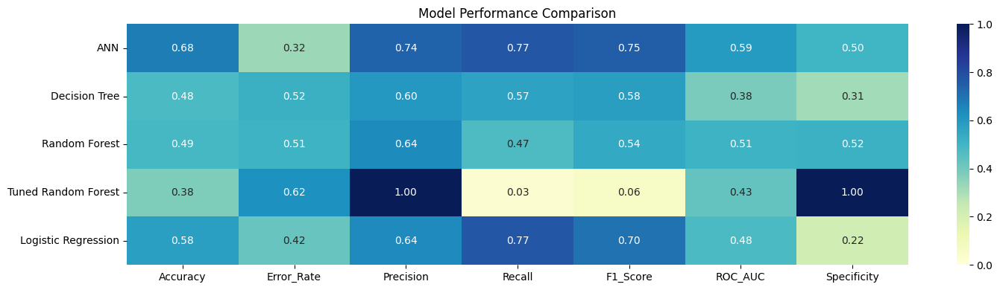

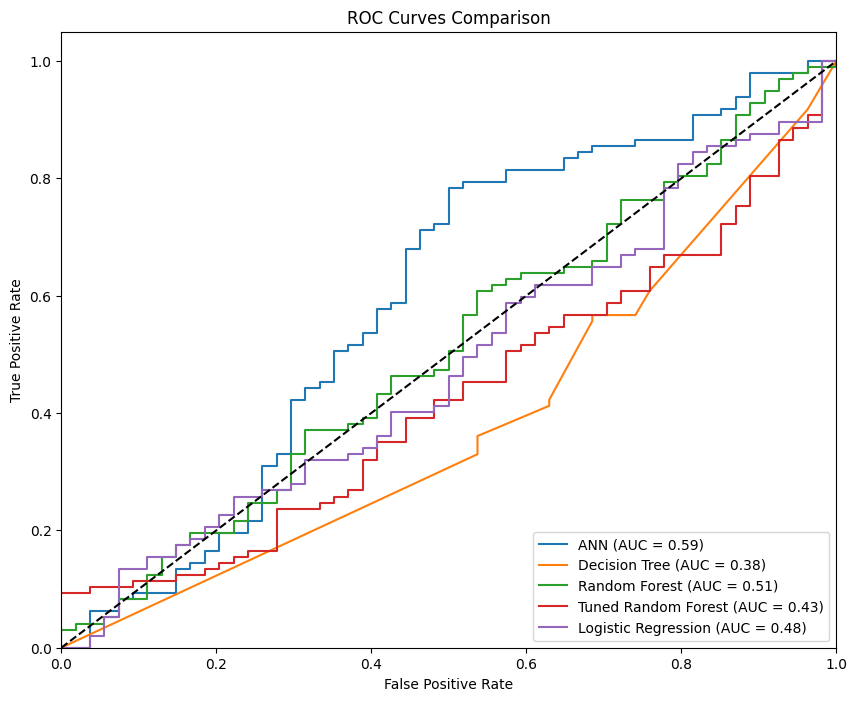

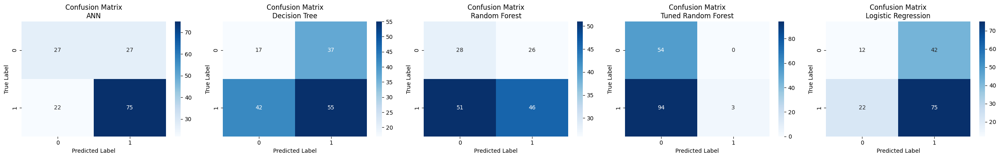


Detailed Performance Report for ANN:
--------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.50      0.52        54
           1       0.74      0.77      0.75        97

    accuracy                           0.68       151
   macro avg       0.64      0.64      0.64       151
weighted avg       0.67      0.68      0.67       151


Additional Metrics:
Error Rate: 0.32
Specificity: 0.500

Detailed Performance Report for Decision Tree:
--------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

           0       0.29      0.31      0.30        54
           1       0.60      0.57      0.58        97

    accuracy                           0.48       151
   macro avg       0.44      0.44      0.44       151
weighted avg       0.49      0.48      0.48       151


Additional Metrics:
Error Rate: 0.52
Specificity: 0.31

In [96]:
# Create a dictionary mapping model names to their corresponding test data
X_test_dict = {
    'ANN': X_test_2,
    'Decision Tree': X_test_2,
    'Random Forest': X_test_2,
    'Tuned Random Forest': X_test_2_selected,
    'Logistic Regression': X_test_selected_lr
}

# Set up the models list with the extracted ANN model
models = [ann_model, dt_model_2, classifier, final_rfmodel_2, final_combined_model]
model_names = ['ANN', 'Decision Tree', 'Random Forest', 'Tuned Random Forest', 'Logistic Regression']

# Evaluate all models using the dictionary of test datasets
metrics_df = evaluate_all_models(models, X_test_dict, y_test_2, model_names)